In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!pip install pyro-ppl
!pip install pot
!pip install tensorboard
!pip install torchdiffeq

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 756.0/756.0 kB 13.1 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-

In [4]:
!rm -rf PFNExperiments
!git clone https://github.com/ArikReuter/PFNExperiments

Cloning into 'PFNExperiments'...
remote: Enumerating objects: 1178, done.
remote: Counting objects: 100% (244/244), done.
remote: Compressing objects: 100% (141/141), done.
remote: Total 1178 (delta 162), reused 177 (delta 103), pack-reused 934
Receiving objects: 100% (1178/1178), 45.24 MiB | 11.29 MiB/s, done.
Resolving deltas: 100% (824/824), done.


In [5]:
import torch
from PFNExperiments.LinearRegression.GenerativeModels.GenerateDataLM_ExamplesSparsity import make_lm_program_Laplace_ig_batched, make_lm_program_Laplace_ig
from PFNExperiments.LinearRegression.GenerativeModels.LM_abstract import return_only_y, print_code
from PFNExperiments.Training.Trainer import visualize_training_results
from PFNExperiments.Training.FlowMatching.CFMLossOTGaussianBase_plus_NLL import CFMLossOTGaussianBase_plus_NLL
from PFNExperiments.LinearRegression.ComparisonModels.Hamiltionion_MC import Hamiltionian_MC
from PFNExperiments.LinearRegression.ComparisonModels.Variational_Inference import Variational_Inference
from PFNExperiments.LinearRegression.Evaluation.CompareComparisonModels import CompareComparisonModels
from PFNExperiments.LinearRegression.GenerativeModels.Curriculum import Curriculum
from PFNExperiments.LinearRegression.GenerativeModels.GenerateDataCurriculumCFM import GenerateDataCurriculumCFM
from PFNExperiments.Training.TrainerCurriculumCNF_LearnedBaseDist_plus_nll import TrainerCurriculumCNF_LearnedBaseDist_plus_nll
from PFNExperiments.LinearRegression.GenerativeModels.GenerateDataLM_Examples import make_lm_program_ig_batched, make_lm_program_ig
from PFNExperiments.LinearRegression.Evaluation.CompareComparisonModels import CompareComparisonModels
from PFNExperiments.LinearRegression.Models.ModelToPosteriorCNF_LearnedBaseDist import ModelToPosteriorCNF_LearnedBaseDist
from PFNExperiments.LinearRegression.Models.Transformer import MLP
from PFNExperiments.LinearRegression.Models.ModelPosterior import ModelPosteriorFullGaussian2
from PFNExperiments.LinearRegression.Models.Transformer_CNF_DoubleCondition2 import TransformerDecoderConditionalDouble_parallel, MLPConditionalDouble_parallel
from PFNExperiments.LinearRegression.Models.Transformer_CNF_LearnedBaseDistribution import TransformerReturnRepresentations, TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution
from PFNExperiments.LinearRegression.ComparisonModels.AnalyticalSolutionsLM import PosteriorLM_IG
from PFNExperiments.Evaluation.Evaluate import Evaluate

In [6]:
torch.backends.cudnn.benchmark = True

In [7]:
N = 100
P = 10
BATCH_SIZE = 1024
N_EPOCHS = 100
N_SAMPLES_PER_EPOCH = 500_000
N_BATCHES_PER_EPOCH = N_SAMPLES_PER_EPOCH//BATCH_SIZE
SAVE_PATH = "/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM"
SAVE_PATH_EVALUATION = f"{SAVE_PATH}/evaluation_PFN_Experiments_CFM_InvGammaLaplace_coupling_LearnedBaseDist_plus_nll_v1"
#BATCH_SIZE = 128

In [8]:
a = 5.0
b = 2.0
tau = 1.0

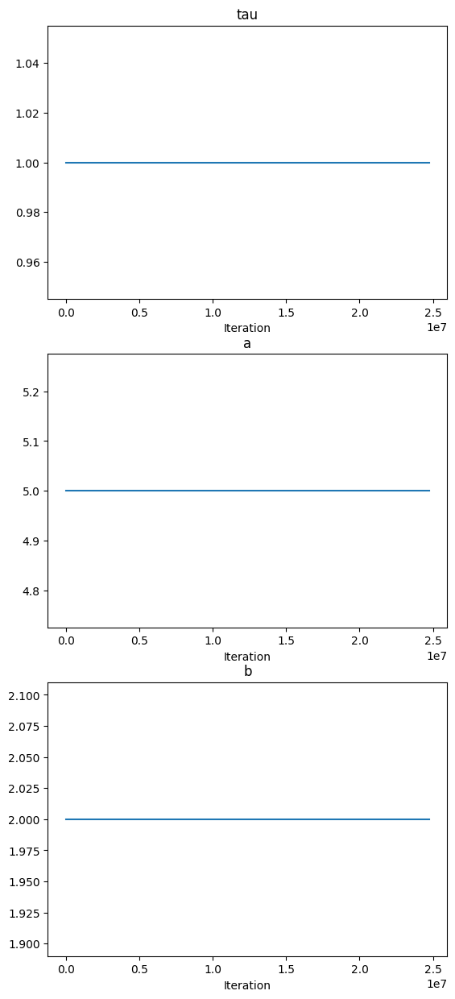

In [9]:
curriculum = Curriculum(max_iter=int(N_EPOCHS*N_BATCHES_PER_EPOCH*BATCH_SIZE*0.5))
curriculum.add_param_list(
    [
    ("tau", curriculum.constant_scheduler(tau)),
    ("a", curriculum.constant_scheduler(a)),
    ("b", curriculum.constant_scheduler(b)),

    ]
)
curriculum.plot_all_schedules()

In [10]:
curriculum.get_params(99*N_SAMPLES_PER_EPOCH)

{'tau': 1.0, 'a': 5.0, 'b': 2.0}

In [11]:
data_generator = GenerateDataCurriculumCFM(
    pprogram_maker= make_lm_program_Laplace_ig_batched,
    curriculum= curriculum,
    #coupling = None
)

####################################################################################################
Epoch 0


100%|██████████| 10/10 [00:00<00:00, 11.29it/s]


{'X': {'mean': tensor(0.5001), 'variance': tensor(0.0833), 'min': tensor(2.9802e-07), 'max': tensor(1.0000)}, 'y': {'mean': tensor(-0.0014), 'variance': tensor(3.5610), 'min': tensor(-17.6717), 'max': tensor(19.7191)}, 'beta': {'mean': tensor([ 0.0252, -0.0184,  0.0228, -0.0100, -0.0175]), 'variance': tensor([1.9814, 1.9320, 1.9096, 1.9719, 2.0941]), 'min': tensor([-8.1768, -5.3453, -6.7506, -7.7457, -7.0065]), 'max': tensor([ 8.6494,  9.3480, 10.9866,  6.7723,  9.1344])}}
Statistics for sigma_squared:
Mean: tensor([0.4953])
Variance: tensor([0.0985])
Min: tensor([0.1076])
Max: tensor([6.9252])


Statistics for time:
Mean: 0.488490170519799
Variance: 0.08199742722131989
Min: 6.502866744995117e-05
Max: 0.9995425939559937


Statistics for base_sample_beta:
Mean: tensor([ 0.0193, -0.0413, -0.0374,  0.0426,  0.0101])
Variance: tensor([1.0195, 0.9719, 0.9501, 1.0020, 0.9769])
Min: tensor([-3.8098, -2.8834, -3.1472, -3.4254, -3.4279])
Max: tensor([3.5780, 3.6003, 3.4659, 4.4401, 3.6200])




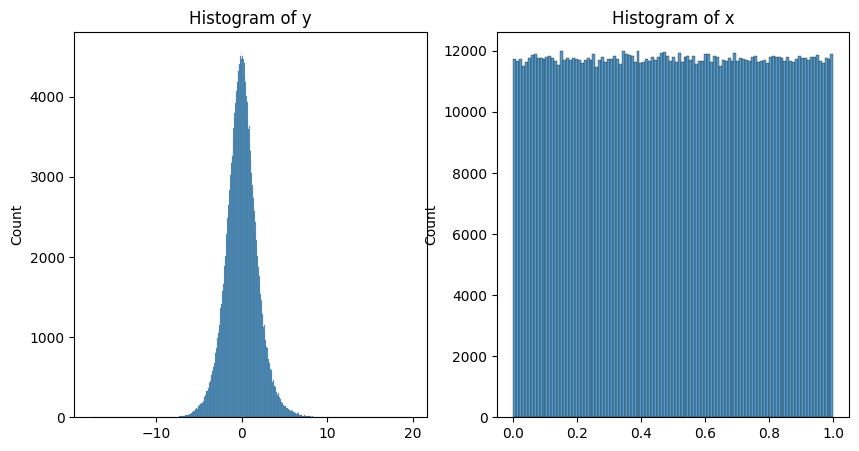

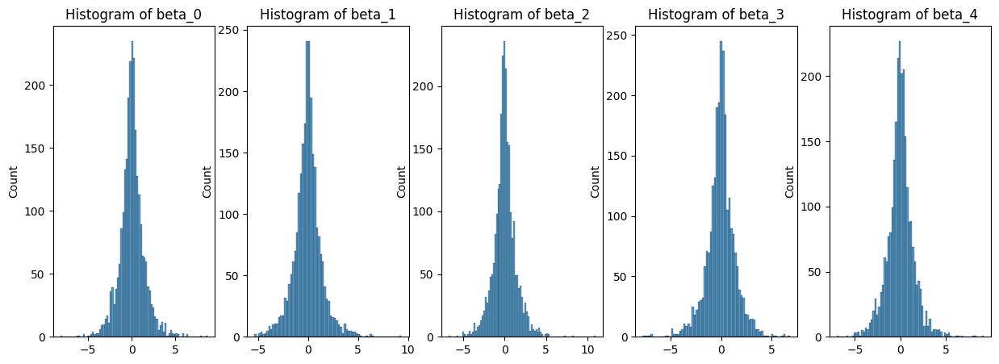

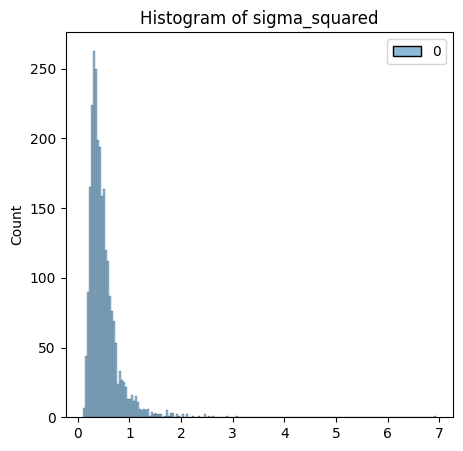

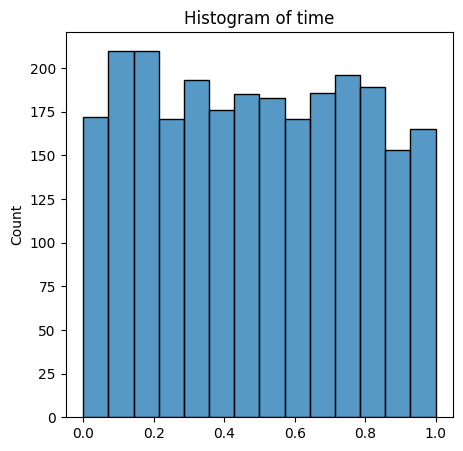

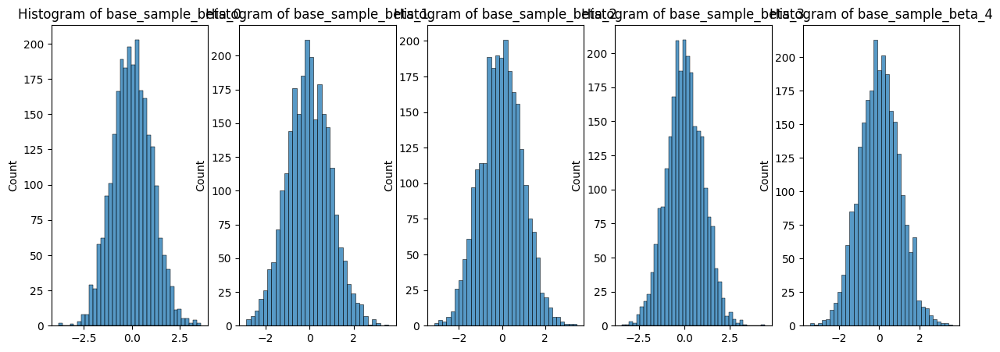

####################################################################################################
Epoch 99


100%|██████████| 10/10 [00:00<00:00, 78.14it/s]

{'X': {'mean': tensor(0.5004), 'variance': tensor(0.0833), 'min': tensor(5.9605e-08), 'max': tensor(1.0000)}, 'y': {'mean': tensor(-0.0322), 'variance': tensor(3.7666), 'min': tensor(-16.1702), 'max': tensor(12.4105)}, 'beta': {'mean': tensor([-0.0092, -0.0035, -0.0239, -0.0366,  0.0159]), 'variance': tensor([2.1061, 2.2175, 1.9233, 2.1580, 1.9749]), 'min': tensor([ -9.0703, -10.6694, -12.8069,  -7.7435,  -6.7545]), 'max': tensor([8.7176, 8.2780, 5.6224, 6.8843, 5.6035])}}
Statistics for sigma_squared:
Mean: tensor([0.5059])
Variance: tensor([0.0807])
Min: tensor([0.1201])
Max: tensor([3.5760])


Statistics for time:
Mean: 0.4938436979893595
Variance: 0.08357616979789467
Min: 0.001080155372619629
Max: 0.9999973773956299


Statistics for base_sample_beta:
Mean: tensor([ 0.0172, -0.0212,  0.0194,  0.0144, -0.0049])
Variance: tensor([1.0035, 1.0535, 1.0495, 1.0280, 1.0214])
Min: tensor([-4.4657, -3.6192, -3.8379, -4.0264, -3.1237])
Max: tensor([3.5181, 4.1192, 3.3376, 3.9440, 3.6260])




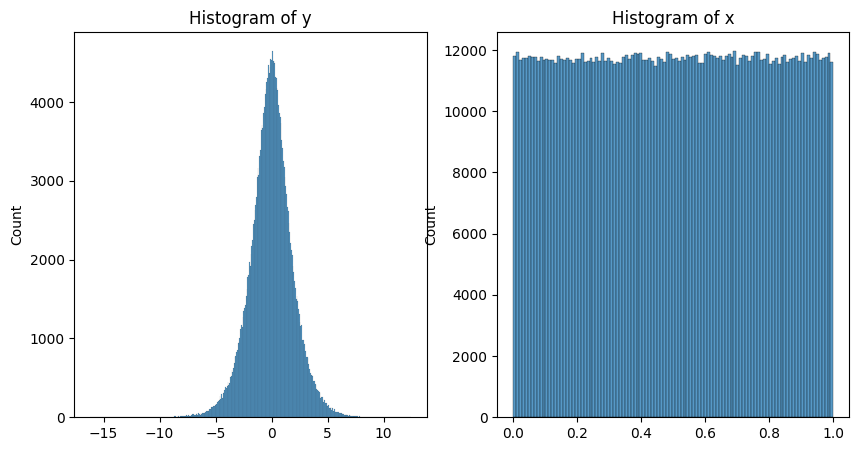

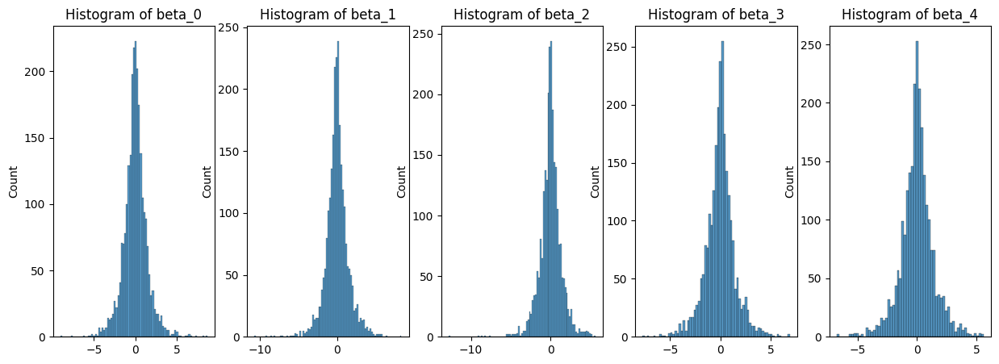

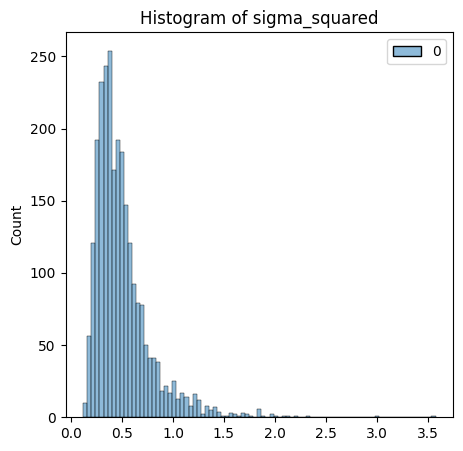

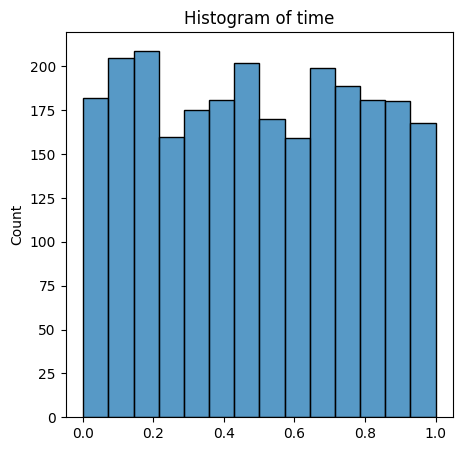

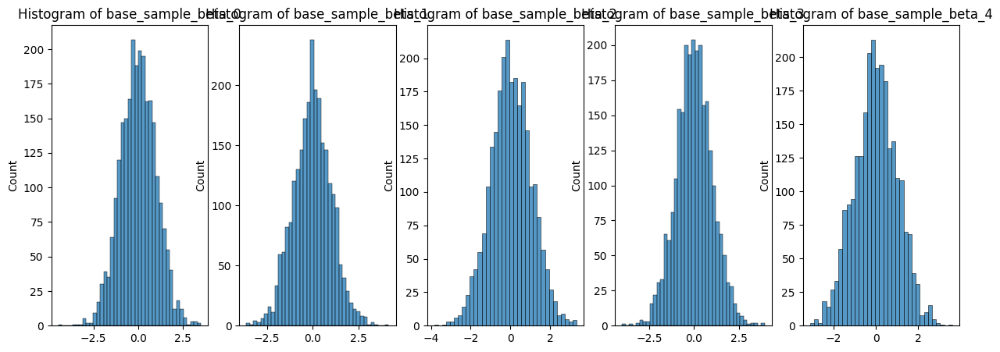

[{'X': {'mean': tensor(0.5001),
   'variance': tensor(0.0833),
   'min': tensor(2.9802e-07),
   'max': tensor(1.0000)},
  'y': {'mean': tensor(-0.0014),
   'variance': tensor(3.5610),
   'min': tensor(-17.6717),
   'max': tensor(19.7191)},
  'beta': {'mean': tensor([ 0.0252, -0.0184,  0.0228, -0.0100, -0.0175]),
   'variance': tensor([1.9814, 1.9320, 1.9096, 1.9719, 2.0941]),
   'min': tensor([-8.1768, -5.3453, -6.7506, -7.7457, -7.0065]),
   'max': tensor([ 8.6494,  9.3480, 10.9866,  6.7723,  9.1344])}},
 {'X': {'mean': tensor(0.5004),
   'variance': tensor(0.0833),
   'min': tensor(5.9605e-08),
   'max': tensor(1.0000)},
  'y': {'mean': tensor(-0.0322),
   'variance': tensor(3.7666),
   'min': tensor(-16.1702),
   'max': tensor(12.4105)},
  'beta': {'mean': tensor([-0.0092, -0.0035, -0.0239, -0.0366,  0.0159]),
   'variance': tensor([2.1061, 2.2175, 1.9233, 2.1580, 1.9749]),
   'min': tensor([ -9.0703, -10.6694, -12.8069,  -7.7435,  -6.7545]),
   'max': tensor([8.7176, 8.2780, 5.6224

In [12]:
data_generator.check_model(
    n_samples_per_epoch=N_SAMPLES_PER_EPOCH,
    epochs_to_check = [0, N_EPOCHS-1],
    p = 5,
    used_batch_samples = 10
)

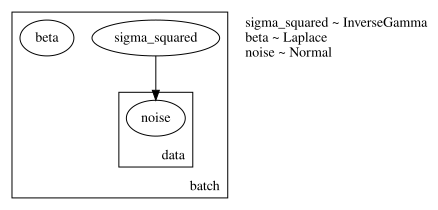

In [13]:
data_generator.render_model()

In [14]:
epoch_loader = data_generator.make_epoch_loader(
    n = N,
    p = P,
    number_of_batches_per_epoch = N_BATCHES_PER_EPOCH,
    n_epochs = N_EPOCHS,
    batch_size= BATCH_SIZE,
    train_frac= 0.5,
    val_frac= 0.1,
    shuffle=False,
    n_samples_to_generate_at_once = 250_000
)

The number of batches times the number of epochs must be equal to the total number of iterations in the curriculum. But got 49971200 and 24985600 respectively


In [15]:
save_path_model = "/content/drive/MyDrive/PFN_Experiments/Training_Runs/experiment_2024_05_29_07_37_35/model.pth"

In [16]:
encoder = TransformerReturnRepresentations(
    n_features= P+1,
    seq_len= N,
    d_model= 512,
    n_heads= 8,
    dim_feedforward=512*2,
    dropout_rate = 0.1,
    n_layers=6,
    n_skip_layers_final_heads = 2,
    n_output_units_per_head=[P, P*P, P]
)

encoder.load_state_dict(torch.load(save_path_model, map_location=torch.device('cpu')))
# get the correct class to transform model predictions to posterior samples

model_posterior = ModelPosteriorFullGaussian2(cov_reg_factor = 1e-3, use_lowrank_normal = False, diag_transform = lambda x: x**2)

nll_loss = model_posterior.negative_log_likelihood
nll_loss_avg = model_posterior.negative_log_likelihood_avg
nll_loss_std = model_posterior.negative_log_likelihood_std
nll_loss_median = model_posterior.negative_log_likelihood_median

mlp_to_process_encoder_output = MLP(
    n_input_units = encoder.d_model,
    n_output_units= 1024,
    n_hidden_units= 1024,
    n_skip_layers= 3,
    dropout_rate = 0.1
)

mlp_to_process_time_conditioning = MLP(
    n_input_units = 1,
    n_output_units = 512,
    n_hidden_units= 512,
    n_skip_layers= 2,
    dropout_rate = 0.1
)
decoder = TransformerDecoderConditionalDouble_parallel(
    n_input_features= P,
    d_model_decoder= 512,
    d_model_encoder= encoder.d_model,
    n_heads= 8,
    d_ff = 512*2,
    dropout= 0.1,
    n_condition_features_a = mlp_to_process_encoder_output.n_output_units,
    n_condition_features_b = mlp_to_process_time_conditioning.n_output_units,
    n_layers= 6,
    use_positional_encoding=False,
    use_self_attention=False,
)
mlp_to_process_decoder_output = MLPConditionalDouble_parallel(
    n_input_units= decoder.d_model_decoder,
    n_output_units = P,
    n_hidden_units = 1024,
    n_skip_layers = 2,
    dropout_rate = 0.1,
    n_condition_features_a = mlp_to_process_encoder_output.n_output_units,
    n_condition_features_b = mlp_to_process_time_conditioning.n_output_units
)
model = TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution(
    encoder = encoder,
    model_posterior = model_posterior,
    mlp_to_process_encoder_output = mlp_to_process_encoder_output,
    mlp_to_process_time_conditioning = mlp_to_process_time_conditioning,
    mlp_to_process_decoder_output = mlp_to_process_decoder_output,
    decoder = decoder,
    freeze_encoder=False,
)

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:306: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


In [17]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

In [18]:
'{:.2e}'.format(count_parameters(model))

'9.63e+07'

In [19]:
import torch
from torch.optim.lr_scheduler import ReduceLROnPlateau, OneCycleLR

In [20]:
lr = 1e-4
opt = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-5)

In [21]:
loss_fun = CFMLossOTGaussianBase_plus_NLL(
    weight_nll = 0.5,
    NLL_Loss_function= nll_loss,
    sigma_min=0.0,
    return_sub_losses=True
)

In [22]:
scheduler = OneCycleLR(opt,
                       max_lr = 1e-4,
                       epochs = N_EPOCHS,
                       steps_per_epoch = N_SAMPLES_PER_EPOCH//BATCH_SIZE,
                       pct_start = 0.1,
                       div_factor=25.0,
                       final_div_factor=1e2)

#scheduler = ReduceLROnPlateau(opt)

additional_evals = {
    "nll_loss": nll_loss,
    "nll_loss_avg": nll_loss_avg,
    "nll_loss_std": nll_loss_std,
    "nll_loss_median": nll_loss_median
}

In [23]:
#?TrainerCurriculumCNF

In [24]:
trainer = TrainerCurriculumCNF_LearnedBaseDist_plus_nll(
    model = model,
    optimizer=opt,
    scheduler = scheduler,
    loss_function=loss_fun,
    epoch_loader = epoch_loader,
    evaluation_functions= additional_evals,
    n_epochs = N_EPOCHS,
    early_stopping_patience = 200,
    schedule_step_on = "batch",
    save_path = SAVE_PATH,
    use_same_timestep_per_batch = False,
    use_train_mode_during_validation = False,
    sub_losses_names = ["loss_FM", "loss_NLL"],
    max_gradient_norm = 1.0

)

In [25]:
trainer.set_new_save_path("/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM/experiment_2024_07_14_09_47_47")
trainer.save_path

'/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM/experiment_2024_07_14_09_47_47'

In [26]:
try:
  trainer.load_best_model()
except Exception as e:
  print("Could not load model")
  print(e)
  pass

In [ ]:
trainer.validate()

  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:34<00:00,  1.44it/s]


{'loss_mean': -0.9360114932060242,
 'loss_median': -0.9225828647613525,
 'loss_std': 0.13395437598228455,
 'loss_FM_mean': 0.6100580096244812,
 'loss_FM_median': 0.5637272000312805,
 'loss_FM_std': 0.17295365035533905,
 'loss_NLL_mean': -2.4820809364318848,
 'loss_NLL_median': -2.473008155822754,
 'loss_NLL_std': 0.19212476909160614}

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/runs

<IPython.core.display.Javascript object>

In [ ]:
r = trainer.train()

Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 0


  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:32<00:00,  1.49it/s]


Epoch 0:
Training: {'loss_mean': 1.1468855142593384, 'loss_median': 0.3756214380264282, 'loss_std': 1.9279330968856812, 'loss_FM_mean': 0.7247508764266968, 'loss_FM_median': 0.6397687196731567, 'loss_FM_std': 0.29632067680358887, 'loss_NLL_mean': 1.56902015209198, 'loss_NLL_median': 0.11751136183738708, 'loss_NLL_std': 3.6220786571502686}
Validation: {'loss_mean': -1.4558829069137573, 'loss_median': -1.4508249759674072, 'loss_std': 0.09373975545167923, 'loss_FM_mean': 0.19641061127185822, 'loss_FM_median': 0.1923198252916336, 'loss_FM_std': 0.020923513919115067, 'loss_NLL_mean': -3.1081767082214355, 'loss_NLL_median': -3.1029138565063477, 'loss_NLL_std': 0.17555956542491913}
Validation curriculum: {'loss_mean': -1.461068034172058, 'loss_median': -1.4577561616897583, 'loss_std': 0.08280545473098755, 'loss_FM_mean': 0.19276683032512665, 'loss_FM_median': 0.1922251433134079, 'loss_FM_std': 0.01974017173051834, 'loss_NLL_mean': -3.1149027347564697, 'loss_NLL_median': -3.107285499572754, 'l

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:35<00:00,  1.36it/s]


Epoch 1:
Training: {'loss_mean': -0.2971198558807373, 'loss_median': -0.3129459619522095, 'loss_std': 0.1643967479467392, 'loss_FM_mean': 0.49020782113075256, 'loss_FM_median': 0.47599005699157715, 'loss_FM_std': 0.0715656653046608, 'loss_NLL_mean': -1.0844475030899048, 'loss_NLL_median': -1.1032042503356934, 'loss_NLL_std': 0.31180745363235474}
Validation: {'loss_mean': -1.781358242034912, 'loss_median': -1.7838389873504639, 'loss_std': 0.07931370288133621, 'loss_FM_mean': 0.15662215650081635, 'loss_FM_median': 0.15610288083553314, 'loss_FM_std': 0.021746745333075523, 'loss_NLL_mean': -3.7193386554718018, 'loss_NLL_median': -3.7359118461608887, 'loss_NLL_std': 0.14527149498462677}
Validation curriculum: {'loss_mean': -1.7873872518539429, 'loss_median': -1.7840657234191895, 'loss_std': 0.08234062045812607, 'loss_FM_mean': 0.15242603421211243, 'loss_FM_median': 0.15242262184619904, 'loss_FM_std': 0.01802285946905613, 'loss_NLL_mean': -3.727200508117676, 'loss_NLL_median': -3.71780157089

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:36<00:00,  1.34it/s]


Epoch 2:
Training: {'loss_mean': -0.43292975425720215, 'loss_median': -0.45083504915237427, 'loss_std': 0.17018043994903564, 'loss_FM_mean': 0.4500679671764374, 'loss_FM_median': 0.4333809018135071, 'loss_FM_std': 0.07660085707902908, 'loss_NLL_mean': -1.3159273862838745, 'loss_NLL_median': -1.3674054145812988, 'loss_NLL_std': 0.3285847008228302}
Validation: {'loss_mean': -1.8041883707046509, 'loss_median': -1.7995569705963135, 'loss_std': 0.08586852997541428, 'loss_FM_mean': 0.1431892067193985, 'loss_FM_median': 0.14239953458309174, 'loss_FM_std': 0.020949076861143112, 'loss_NLL_mean': -3.751565456390381, 'loss_NLL_median': -3.749448776245117, 'loss_NLL_std': 0.15979628264904022}
Validation curriculum: {'loss_mean': -1.808488368988037, 'loss_median': -1.7942090034484863, 'loss_std': 0.07728855311870575, 'loss_FM_mean': 0.1415456235408783, 'loss_FM_median': 0.13669562339782715, 'loss_FM_std': 0.019606325775384903, 'loss_NLL_mean': -3.758521795272827, 'loss_NLL_median': -3.7472329139709

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:36<00:00,  1.36it/s]


Epoch 3:
Training: {'loss_mean': -0.5270940661430359, 'loss_median': -0.5427755117416382, 'loss_std': 0.131119966506958, 'loss_FM_mean': 0.4213394522666931, 'loss_FM_median': 0.4051242470741272, 'loss_FM_std': 0.08906487375497818, 'loss_NLL_mean': -1.4755276441574097, 'loss_NLL_median': -1.5038793087005615, 'loss_NLL_std': 0.24673286080360413}
Validation: {'loss_mean': -1.8207734823226929, 'loss_median': -1.8142216205596924, 'loss_std': 0.07244983315467834, 'loss_FM_mean': 0.13312023878097534, 'loss_FM_median': 0.13018687069416046, 'loss_FM_std': 0.019868100062012672, 'loss_NLL_mean': -3.7746670246124268, 'loss_NLL_median': -3.7707996368408203, 'loss_NLL_std': 0.13330034911632538}
Validation curriculum: {'loss_mean': -1.825092077255249, 'loss_median': -1.8233002424240112, 'loss_std': 0.0872906818985939, 'loss_FM_mean': 0.13461463153362274, 'loss_FM_median': 0.13377682864665985, 'loss_FM_std': 0.019982077181339264, 'loss_NLL_mean': -3.7847988605499268, 'loss_NLL_median': -3.773624897003

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:35<00:00,  1.39it/s]


Epoch 4:
Training: {'loss_mean': -0.533988356590271, 'loss_median': -0.5745633840560913, 'loss_std': 0.16123151779174805, 'loss_FM_mean': 0.4151610732078552, 'loss_FM_median': 0.3900257647037506, 'loss_FM_std': 0.09599600732326508, 'loss_NLL_mean': -1.483137845993042, 'loss_NLL_median': -1.5539298057556152, 'loss_NLL_std': 0.312972754240036}
Validation: {'loss_mean': -1.7367171049118042, 'loss_median': -1.7250597476959229, 'loss_std': 0.07816732674837112, 'loss_FM_mean': 0.1470899134874344, 'loss_FM_median': 0.1431419998407364, 'loss_FM_std': 0.03028148226439953, 'loss_NLL_mean': -3.6205244064331055, 'loss_NLL_median': -3.6170639991760254, 'loss_NLL_std': 0.14034920930862427}
Validation curriculum: {'loss_mean': -1.7525768280029297, 'loss_median': -1.7548720836639404, 'loss_std': 0.06202390417456627, 'loss_FM_mean': 0.13831716775894165, 'loss_FM_median': 0.12942096590995789, 'loss_FM_std': 0.026229586452245712, 'loss_NLL_mean': -3.643470525741577, 'loss_NLL_median': -3.643980026245117,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:35<00:00,  1.37it/s]


Epoch 5:
Training: {'loss_mean': -0.5516698956489563, 'loss_median': -0.5839499235153198, 'loss_std': 0.1522030383348465, 'loss_FM_mean': 0.38794684410095215, 'loss_FM_median': 0.37318503856658936, 'loss_FM_std': 0.0784091055393219, 'loss_NLL_mean': -1.4912866353988647, 'loss_NLL_median': -1.5686836242675781, 'loss_NLL_std': 0.29217034578323364}
Validation: {'loss_mean': -1.7138265371322632, 'loss_median': -1.7050155401229858, 'loss_std': 0.08007383346557617, 'loss_FM_mean': 0.13462290167808533, 'loss_FM_median': 0.12776891887187958, 'loss_FM_std': 0.023820919916033745, 'loss_NLL_mean': -3.5622758865356445, 'loss_NLL_median': -3.5498273372650146, 'loss_NLL_std': 0.15080979466438293}
Validation curriculum: {'loss_mean': -1.6857110261917114, 'loss_median': -1.6844018697738647, 'loss_std': 0.08825526386499405, 'loss_FM_mean': 0.14422006905078888, 'loss_FM_median': 0.13432835042476654, 'loss_FM_std': 0.03685615956783295, 'loss_NLL_mean': -3.5156424045562744, 'loss_NLL_median': -3.533630371

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:36<00:00,  1.33it/s]


Epoch 6:
Training: {'loss_mean': -0.5262172818183899, 'loss_median': -0.5501946210861206, 'loss_std': 0.16505591571331024, 'loss_FM_mean': 0.41216906905174255, 'loss_FM_median': 0.38550296425819397, 'loss_FM_std': 0.10930090397596359, 'loss_NLL_mean': -1.4646036624908447, 'loss_NLL_median': -1.5287747383117676, 'loss_NLL_std': 0.31567609310150146}
Validation: {'loss_mean': -1.7782598733901978, 'loss_median': -1.786558985710144, 'loss_std': 0.08094355463981628, 'loss_FM_mean': 0.16573180258274078, 'loss_FM_median': 0.1533263772726059, 'loss_FM_std': 0.04922338202595711, 'loss_NLL_mean': -3.7222516536712646, 'loss_NLL_median': -3.7301695346832275, 'loss_NLL_std': 0.1368439793586731}
Validation curriculum: {'loss_mean': -1.77740478515625, 'loss_median': -1.7802003622055054, 'loss_std': 0.07970836758613586, 'loss_FM_mean': 0.163455531001091, 'loss_FM_median': 0.15663893520832062, 'loss_FM_std': 0.043518055230379105, 'loss_NLL_mean': -3.7182648181915283, 'loss_NLL_median': -3.72778224945068

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:35<00:00,  1.37it/s]


Epoch 7:
Training: {'loss_mean': -0.5479483604431152, 'loss_median': -0.5666137933731079, 'loss_std': 0.15215960144996643, 'loss_FM_mean': 0.38241827487945557, 'loss_FM_median': 0.35719823837280273, 'loss_FM_std': 0.1039060652256012, 'loss_NLL_mean': -1.478314995765686, 'loss_NLL_median': -1.525712490081787, 'loss_NLL_std': 0.2919049561023712}
Validation: {'loss_mean': -1.7088979482650757, 'loss_median': -1.7073854207992554, 'loss_std': 0.0634944811463356, 'loss_FM_mean': 0.14103032648563385, 'loss_FM_median': 0.13478223979473114, 'loss_FM_std': 0.03386874869465828, 'loss_NLL_mean': -3.558825969696045, 'loss_NLL_median': -3.5710716247558594, 'loss_NLL_std': 0.11147705465555191}
Validation curriculum: {'loss_mean': -1.7010799646377563, 'loss_median': -1.6964057683944702, 'loss_std': 0.06612370908260345, 'loss_FM_mean': 0.14239245653152466, 'loss_FM_median': 0.14097607135772705, 'loss_FM_std': 0.02641955204308033, 'loss_NLL_mean': -3.5445523262023926, 'loss_NLL_median': -3.53114199638366

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:36<00:00,  1.34it/s]


Epoch 8:
Training: {'loss_mean': -0.5317786931991577, 'loss_median': -0.5477414727210999, 'loss_std': 0.1533564329147339, 'loss_FM_mean': 0.3890596032142639, 'loss_FM_median': 0.36896568536758423, 'loss_FM_std': 0.10710316896438599, 'loss_NLL_mean': -1.452616810798645, 'loss_NLL_median': -1.503003716468811, 'loss_NLL_std': 0.291678249835968}
Validation: {'loss_mean': -1.526649832725525, 'loss_median': -1.5177867412567139, 'loss_std': 0.0806182324886322, 'loss_FM_mean': 0.23522572219371796, 'loss_FM_median': 0.22505255043506622, 'loss_FM_std': 0.08767087012529373, 'loss_NLL_mean': -3.288525342941284, 'loss_NLL_median': -3.2684807777404785, 'loss_NLL_std': 0.11708534508943558}
Validation curriculum: {'loss_mean': -1.5425413846969604, 'loss_median': -1.5400280952453613, 'loss_std': 0.08163044601678848, 'loss_FM_mean': 0.2036999613046646, 'loss_FM_median': 0.18712493777275085, 'loss_FM_std': 0.0721033364534378, 'loss_NLL_mean': -3.288782835006714, 'loss_NLL_median': -3.302286148071289, 'lo

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:36<00:00,  1.34it/s]


Epoch 9:
Training: {'loss_mean': -0.5138272047042847, 'loss_median': -0.5373657941818237, 'loss_std': 0.1555013507604599, 'loss_FM_mean': 0.393105685710907, 'loss_FM_median': 0.3672599196434021, 'loss_FM_std': 0.10680355131626129, 'loss_NLL_mean': -1.420760154724121, 'loss_NLL_median': -1.4599804878234863, 'loss_NLL_std': 0.30634015798568726}
Validation: {'loss_mean': -1.6756504774093628, 'loss_median': -1.684679627418518, 'loss_std': 0.10205451399087906, 'loss_FM_mean': 0.23716780543327332, 'loss_FM_median': 0.21653755009174347, 'loss_FM_std': 0.10020039230585098, 'loss_NLL_mean': -3.5884687900543213, 'loss_NLL_median': -3.5938169956207275, 'loss_NLL_std': 0.14378997683525085}
Validation curriculum: {'loss_mean': -1.684677004814148, 'loss_median': -1.6847857236862183, 'loss_std': 0.08368867635726929, 'loss_FM_mean': 0.22405444085597992, 'loss_FM_median': 0.198082834482193, 'loss_FM_std': 0.09471773356199265, 'loss_NLL_mean': -3.5934085845947266, 'loss_NLL_median': -3.5857796669006348,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:35<00:00,  1.38it/s]


Epoch 10:
Training: {'loss_mean': -0.5118467211723328, 'loss_median': -0.5442904829978943, 'loss_std': 0.1738414317369461, 'loss_FM_mean': 0.38397109508514404, 'loss_FM_median': 0.364820271730423, 'loss_FM_std': 0.10241146385669708, 'loss_NLL_mean': -1.4076645374298096, 'loss_NLL_median': -1.4615628719329834, 'loss_NLL_std': 0.32763734459877014}
Validation: {'loss_mean': -1.3541016578674316, 'loss_median': -1.3506156206130981, 'loss_std': 0.06645022332668304, 'loss_FM_mean': 0.15310686826705933, 'loss_FM_median': 0.14659760892391205, 'loss_FM_std': 0.03371516615152359, 'loss_NLL_mean': -2.8613104820251465, 'loss_NLL_median': -2.8469185829162598, 'loss_NLL_std': 0.11515067517757416}
Validation curriculum: {'loss_mean': -1.3294347524642944, 'loss_median': -1.32375168800354, 'loss_std': 0.07661665230989456, 'loss_FM_mean': 0.17080292105674744, 'loss_FM_median': 0.1448258012533188, 'loss_FM_std': 0.05370856821537018, 'loss_NLL_mean': -2.829672336578369, 'loss_NLL_median': -2.80623102188110

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:34<00:00,  1.42it/s]


Epoch 11:
Training: {'loss_mean': -0.5033956170082092, 'loss_median': -0.52138751745224, 'loss_std': 0.15801310539245605, 'loss_FM_mean': 0.3946952521800995, 'loss_FM_median': 0.3746418356895447, 'loss_FM_std': 0.11878262460231781, 'loss_NLL_mean': -1.4014863967895508, 'loss_NLL_median': -1.4583133459091187, 'loss_NLL_std': 0.2906421720981598}
Validation: {'loss_mean': -1.465084195137024, 'loss_median': -1.466405987739563, 'loss_std': 0.07198137789964676, 'loss_FM_mean': 0.21085186302661896, 'loss_FM_median': 0.2016160935163498, 'loss_FM_std': 0.06734657287597656, 'loss_NLL_mean': -3.1410200595855713, 'loss_NLL_median': -3.1343822479248047, 'loss_NLL_std': 0.12666316330432892}
Validation curriculum: {'loss_mean': -1.4818053245544434, 'loss_median': -1.4843214750289917, 'loss_std': 0.08845231682062149, 'loss_FM_mean': 0.20436592400074005, 'loss_FM_median': 0.19107110798358917, 'loss_FM_std': 0.06756751984357834, 'loss_NLL_mean': -3.1679766178131104, 'loss_NLL_median': -3.176130771636963

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:36<00:00,  1.35it/s]


Epoch 12:
Training: {'loss_mean': -0.4744674563407898, 'loss_median': -0.5024325251579285, 'loss_std': 0.17082619667053223, 'loss_FM_mean': 0.39583685994148254, 'loss_FM_median': 0.3816286325454712, 'loss_FM_std': 0.09789852797985077, 'loss_NLL_mean': -1.3447716236114502, 'loss_NLL_median': -1.3970372676849365, 'loss_NLL_std': 0.32526877522468567}
Validation: {'loss_mean': -1.564985990524292, 'loss_median': -1.5628516674041748, 'loss_std': 0.088229700922966, 'loss_FM_mean': 0.19913946092128754, 'loss_FM_median': 0.15789417922496796, 'loss_FM_std': 0.09462562948465347, 'loss_NLL_mean': -3.3291115760803223, 'loss_NLL_median': -3.343843460083008, 'loss_NLL_std': 0.12210377305746078}
Validation curriculum: {'loss_mean': -1.5735498666763306, 'loss_median': -1.5680333375930786, 'loss_std': 0.09670501947402954, 'loss_FM_mean': 0.1959395706653595, 'loss_FM_median': 0.1647697389125824, 'loss_FM_std': 0.08204875886440277, 'loss_NLL_mean': -3.3430392742156982, 'loss_NLL_median': -3.33645963668823

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:35<00:00,  1.39it/s]


Epoch 13:
Training: {'loss_mean': -0.457845002412796, 'loss_median': -0.4681645631790161, 'loss_std': 0.1590164750814438, 'loss_FM_mean': 0.43616363406181335, 'loss_FM_median': 0.40430647134780884, 'loss_FM_std': 0.1528346836566925, 'loss_NLL_mean': -1.351853609085083, 'loss_NLL_median': -1.384163498878479, 'loss_NLL_std': 0.26255300641059875}
Validation: {'loss_mean': -1.4547929763793945, 'loss_median': -1.4887531995773315, 'loss_std': 0.14047089219093323, 'loss_FM_mean': 0.2604511082172394, 'loss_FM_median': 0.19118903577327728, 'loss_FM_std': 0.20220273733139038, 'loss_NLL_mean': -3.170036792755127, 'loss_NLL_median': -3.1788501739501953, 'loss_NLL_std': 0.1339826136827469}
Validation curriculum: {'loss_mean': -1.434147596359253, 'loss_median': -1.420516848564148, 'loss_std': 0.11014040559530258, 'loss_FM_mean': 0.27336224913597107, 'loss_FM_median': 0.23427705466747284, 'loss_FM_std': 0.15238814055919647, 'loss_NLL_mean': -3.1416573524475098, 'loss_NLL_median': -3.1453065872192383,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:33<00:00,  1.46it/s]


Epoch 14:
Training: {'loss_mean': -0.4389076232910156, 'loss_median': -0.46806156635284424, 'loss_std': 0.1558314710855484, 'loss_FM_mean': 0.4405466616153717, 'loss_FM_median': 0.4194885790348053, 'loss_FM_std': 0.13881173729896545, 'loss_NLL_mean': -1.318361759185791, 'loss_NLL_median': -1.3719353675842285, 'loss_NLL_std': 0.273184597492218}
Validation: {'loss_mean': -1.4822168350219727, 'loss_median': -1.5007576942443848, 'loss_std': 0.09069400280714035, 'loss_FM_mean': 0.20979507267475128, 'loss_FM_median': 0.19221846759319305, 'loss_FM_std': 0.07278617471456528, 'loss_NLL_mean': -3.1742286682128906, 'loss_NLL_median': -3.185161590576172, 'loss_NLL_std': 0.1382260024547577}
Validation curriculum: {'loss_mean': -1.4852101802825928, 'loss_median': -1.4796197414398193, 'loss_std': 0.08825955539941788, 'loss_FM_mean': 0.21825236082077026, 'loss_FM_median': 0.18107250332832336, 'loss_FM_std': 0.11980950832366943, 'loss_NLL_mean': -3.1886725425720215, 'loss_NLL_median': -3.17789196968078

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:33<00:00,  1.47it/s]


Epoch 15:
Training: {'loss_mean': -0.46281975507736206, 'loss_median': -0.47722524404525757, 'loss_std': 0.1574605405330658, 'loss_FM_mean': 0.43902793526649475, 'loss_FM_median': 0.41510850191116333, 'loss_FM_std': 0.1279366910457611, 'loss_NLL_mean': -1.364667296409607, 'loss_NLL_median': -1.408512830734253, 'loss_NLL_std': 0.2745022475719452}
Validation: {'loss_mean': -1.4796233177185059, 'loss_median': -1.466450572013855, 'loss_std': 0.08254529535770416, 'loss_FM_mean': 0.1715446412563324, 'loss_FM_median': 0.15551072359085083, 'loss_FM_std': 0.06378138810396194, 'loss_NLL_mean': -3.130791425704956, 'loss_NLL_median': -3.1218323707580566, 'loss_NLL_std': 0.13405810296535492}
Validation curriculum: {'loss_mean': -1.4699199199676514, 'loss_median': -1.4521923065185547, 'loss_std': 0.07936843484640121, 'loss_FM_mean': 0.1755770891904831, 'loss_FM_median': 0.15735545754432678, 'loss_FM_std': 0.059301815927028656, 'loss_NLL_mean': -3.115417242050171, 'loss_NLL_median': -3.09367966651916

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:34<00:00,  1.41it/s]


Epoch 16:
Training: {'loss_mean': -0.46376800537109375, 'loss_median': -0.496510773897171, 'loss_std': 0.14282962679862976, 'loss_FM_mean': 0.40908733010292053, 'loss_FM_median': 0.38900119066238403, 'loss_FM_std': 0.11572838574647903, 'loss_NLL_mean': -1.3366234302520752, 'loss_NLL_median': -1.3696777820587158, 'loss_NLL_std': 0.255079448223114}
Validation: {'loss_mean': -1.459979772567749, 'loss_median': -1.4652180671691895, 'loss_std': 0.07540864497423172, 'loss_FM_mean': 0.20134393870830536, 'loss_FM_median': 0.18017791211605072, 'loss_FM_std': 0.07681713998317719, 'loss_NLL_mean': -3.1213033199310303, 'loss_NLL_median': -3.131141185760498, 'loss_NLL_std': 0.11980626732110977}
Validation curriculum: {'loss_mean': -1.4667868614196777, 'loss_median': -1.4800493717193604, 'loss_std': 0.09701857715845108, 'loss_FM_mean': 0.20119325816631317, 'loss_FM_median': 0.18215975165367126, 'loss_FM_std': 0.08417163044214249, 'loss_NLL_mean': -3.1347672939300537, 'loss_NLL_median': -3.15862774848

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:33<00:00,  1.47it/s]


Epoch 17:
Training: {'loss_mean': -0.45394712686538696, 'loss_median': -0.4738525152206421, 'loss_std': 0.1527843177318573, 'loss_FM_mean': 0.4333861172199249, 'loss_FM_median': 0.40734410285949707, 'loss_FM_std': 0.12243666499853134, 'loss_NLL_mean': -1.341280460357666, 'loss_NLL_median': -1.3821513652801514, 'loss_NLL_std': 0.28348860144615173}
Validation: {'loss_mean': -0.9917833805084229, 'loss_median': -0.9883224964141846, 'loss_std': 0.06037228927016258, 'loss_FM_mean': 0.1879296749830246, 'loss_FM_median': 0.1843041032552719, 'loss_FM_std': 0.05187035724520683, 'loss_NLL_mean': -2.171496629714966, 'loss_NLL_median': -2.159165859222412, 'loss_NLL_std': 0.10529624670743942}
Validation curriculum: {'loss_mean': -0.9739670157432556, 'loss_median': -0.9698672294616699, 'loss_std': 0.07067924737930298, 'loss_FM_mean': 0.20090340077877045, 'loss_FM_median': 0.18588519096374512, 'loss_FM_std': 0.06811683624982834, 'loss_NLL_mean': -2.1488375663757324, 'loss_NLL_median': -2.1577544212341

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:34<00:00,  1.42it/s]


Epoch 18:
Training: {'loss_mean': -0.4619312286376953, 'loss_median': -0.48474612832069397, 'loss_std': 0.13930800557136536, 'loss_FM_mean': 0.3953101336956024, 'loss_FM_median': 0.376206636428833, 'loss_FM_std': 0.09795638918876648, 'loss_NLL_mean': -1.3191726207733154, 'loss_NLL_median': -1.360837697982788, 'loss_NLL_std': 0.2735080122947693}
Validation: {'loss_mean': -1.002005934715271, 'loss_median': -1.0254848003387451, 'loss_std': 0.14821209013462067, 'loss_FM_mean': 0.4365207254886627, 'loss_FM_median': 0.38313308358192444, 'loss_FM_std': 0.2398996651172638, 'loss_NLL_mean': -2.440532684326172, 'loss_NLL_median': -2.4376068115234375, 'loss_NLL_std': 0.1114487424492836}
Validation curriculum: {'loss_mean': -1.0185043811798096, 'loss_median': -1.021152138710022, 'loss_std': 0.12719444930553436, 'loss_FM_mean': 0.41281208395957947, 'loss_FM_median': 0.369128942489624, 'loss_FM_std': 0.20939978957176208, 'loss_NLL_mean': -2.4498209953308105, 'loss_NLL_median': -2.441053867340088, 'l

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:34<00:00,  1.41it/s]


Epoch 19:
Training: {'loss_mean': -0.45427998900413513, 'loss_median': -0.4729602038860321, 'loss_std': 0.15471632778644562, 'loss_FM_mean': 0.43247711658477783, 'loss_FM_median': 0.4195725917816162, 'loss_FM_std': 0.11855892091989517, 'loss_NLL_mean': -1.3410370349884033, 'loss_NLL_median': -1.385125756263733, 'loss_NLL_std': 0.2870917320251465}
Validation: {'loss_mean': -1.3289068937301636, 'loss_median': -1.3469264507293701, 'loss_std': 0.10023877769708633, 'loss_FM_mean': 0.2914373278617859, 'loss_FM_median': 0.25580865144729614, 'loss_FM_std': 0.1477631777524948, 'loss_NLL_mean': -2.9492509365081787, 'loss_NLL_median': -2.9495668411254883, 'loss_NLL_std': 0.12218723446130753}
Validation curriculum: {'loss_mean': -1.333206057548523, 'loss_median': -1.3717308044433594, 'loss_std': 0.12492948025465012, 'loss_FM_mean': 0.2985055446624756, 'loss_FM_median': 0.2295294851064682, 'loss_FM_std': 0.17607825994491577, 'loss_NLL_mean': -2.9649176597595215, 'loss_NLL_median': -2.97916603088378

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:34<00:00,  1.41it/s]


Epoch 20:
Training: {'loss_mean': -0.44256138801574707, 'loss_median': -0.46048784255981445, 'loss_std': 0.15312516689300537, 'loss_FM_mean': 0.4224661886692047, 'loss_FM_median': 0.3842763304710388, 'loss_FM_std': 0.13564328849315643, 'loss_NLL_mean': -1.307588815689087, 'loss_NLL_median': -1.366101861000061, 'loss_NLL_std': 0.2657874524593353}
Validation: {'loss_mean': -1.5134989023208618, 'loss_median': -1.518629789352417, 'loss_std': 0.105272576212883, 'loss_FM_mean': 0.22534598410129547, 'loss_FM_median': 0.20119033753871918, 'loss_FM_std': 0.10677385330200195, 'loss_NLL_mean': -3.2523441314697266, 'loss_NLL_median': -3.2575695514678955, 'loss_NLL_std': 0.13531245291233063}
Validation curriculum: {'loss_mean': -1.5067949295043945, 'loss_median': -1.5153326988220215, 'loss_std': 0.0793566033244133, 'loss_FM_mean': 0.20399576425552368, 'loss_FM_median': 0.19136027991771698, 'loss_FM_std': 0.07793987542390823, 'loss_NLL_mean': -3.217586040496826, 'loss_NLL_median': -3.228327274322509

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:34<00:00,  1.44it/s]


Epoch 21:
Training: {'loss_mean': -0.4658551812171936, 'loss_median': -0.49590498208999634, 'loss_std': 0.16722647845745087, 'loss_FM_mean': 0.438368558883667, 'loss_FM_median': 0.4015207886695862, 'loss_FM_std': 0.1389903575181961, 'loss_NLL_mean': -1.3700790405273438, 'loss_NLL_median': -1.4115322828292847, 'loss_NLL_std': 0.28716984391212463}
Validation: {'loss_mean': -1.3995705842971802, 'loss_median': -1.4199215173721313, 'loss_std': 0.12062407284975052, 'loss_FM_mean': 0.2937994599342346, 'loss_FM_median': 0.2688424289226532, 'loss_FM_std': 0.1587434709072113, 'loss_NLL_mean': -3.092940330505371, 'loss_NLL_median': -3.093472957611084, 'loss_NLL_std': 0.14867782592773438}
Validation curriculum: {'loss_mean': -1.4238224029541016, 'loss_median': -1.4411174058914185, 'loss_std': 0.10176517069339752, 'loss_FM_mean': 0.24776357412338257, 'loss_FM_median': 0.22603969275951385, 'loss_FM_std': 0.12812575697898865, 'loss_NLL_mean': -3.0954084396362305, 'loss_NLL_median': -3.082050800323486

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:32<00:00,  1.50it/s]


Epoch 22:
Training: {'loss_mean': -0.48955872654914856, 'loss_median': -0.5145475268363953, 'loss_std': 0.13375961780548096, 'loss_FM_mean': 0.39618775248527527, 'loss_FM_median': 0.37218210101127625, 'loss_FM_std': 0.11484640091657639, 'loss_NLL_mean': -1.3753052949905396, 'loss_NLL_median': -1.421345829963684, 'loss_NLL_std': 0.24420978128910065}
Validation: {'loss_mean': -1.0585142374038696, 'loss_median': -1.0915039777755737, 'loss_std': 0.10622139275074005, 'loss_FM_mean': 0.3055971562862396, 'loss_FM_median': 0.2900463044643402, 'loss_FM_std': 0.11850795894861221, 'loss_NLL_mean': -2.4226253032684326, 'loss_NLL_median': -2.429518699645996, 'loss_NLL_std': 0.12602543830871582}
Validation curriculum: {'loss_mean': -1.0642832517623901, 'loss_median': -1.0817484855651855, 'loss_std': 0.09013751149177551, 'loss_FM_mean': 0.3204396665096283, 'loss_FM_median': 0.30513402819633484, 'loss_FM_std': 0.1128360778093338, 'loss_NLL_mean': -2.4490063190460205, 'loss_NLL_median': -2.458518981933

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:33<00:00,  1.46it/s]


Epoch 23:
Training: {'loss_mean': -0.5083874464035034, 'loss_median': -0.5274124145507812, 'loss_std': 0.12990880012512207, 'loss_FM_mean': 0.4088451564311981, 'loss_FM_median': 0.3811131417751312, 'loss_FM_std': 0.12882687151432037, 'loss_NLL_mean': -1.4256200790405273, 'loss_NLL_median': -1.4741052389144897, 'loss_NLL_std': 0.23342153429985046}
Validation: {'loss_mean': -1.0525635480880737, 'loss_median': -1.0522226095199585, 'loss_std': 0.08244602382183075, 'loss_FM_mean': 0.2011636644601822, 'loss_FM_median': 0.18120628595352173, 'loss_FM_std': 0.07391604036092758, 'loss_NLL_mean': -2.306290626525879, 'loss_NLL_median': -2.303776741027832, 'loss_NLL_std': 0.1190357357263565}
Validation curriculum: {'loss_mean': -1.0500764846801758, 'loss_median': -1.0569781064987183, 'loss_std': 0.07029204815626144, 'loss_FM_mean': 0.21235720813274384, 'loss_FM_median': 0.19654279947280884, 'loss_FM_std': 0.06966403871774673, 'loss_NLL_mean': -2.3125100135803223, 'loss_NLL_median': -2.3117637634277

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:33<00:00,  1.46it/s]


Epoch 24:
Training: {'loss_mean': -0.5031391978263855, 'loss_median': -0.5268793702125549, 'loss_std': 0.14258868992328644, 'loss_FM_mean': 0.3793116509914398, 'loss_FM_median': 0.36363348364830017, 'loss_FM_std': 0.09941302984952927, 'loss_NLL_mean': -1.3855899572372437, 'loss_NLL_median': -1.4328386783599854, 'loss_NLL_std': 0.26964977383613586}
Validation: {'loss_mean': -1.3879886865615845, 'loss_median': -1.378805160522461, 'loss_std': 0.11043435335159302, 'loss_FM_mean': 0.3059898614883423, 'loss_FM_median': 0.28740546107292175, 'loss_FM_std': 0.12627212703227997, 'loss_NLL_mean': -3.081967353820801, 'loss_NLL_median': -3.097219467163086, 'loss_NLL_std': 0.13808460533618927}
Validation curriculum: {'loss_mean': -1.382777452468872, 'loss_median': -1.4099440574645996, 'loss_std': 0.14605005085468292, 'loss_FM_mean': 0.33338016271591187, 'loss_FM_median': 0.2915191352367401, 'loss_FM_std': 0.19864019751548767, 'loss_NLL_mean': -3.098935127258301, 'loss_NLL_median': -3.121954441070556

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:34<00:00,  1.42it/s]


Epoch 25:
Training: {'loss_mean': -0.498984694480896, 'loss_median': -0.5098308324813843, 'loss_std': 0.13230374455451965, 'loss_FM_mean': 0.3938821852207184, 'loss_FM_median': 0.3782159984111786, 'loss_FM_std': 0.1132897362112999, 'loss_NLL_mean': -1.3918514251708984, 'loss_NLL_median': -1.4220811128616333, 'loss_NLL_std': 0.2559727132320404}
Validation: {'loss_mean': -1.361751675605774, 'loss_median': -1.3680760860443115, 'loss_std': 0.1165059357881546, 'loss_FM_mean': 0.24378763139247894, 'loss_FM_median': 0.22842736542224884, 'loss_FM_std': 0.10007171332836151, 'loss_NLL_mean': -2.9672904014587402, 'loss_NLL_median': -2.9852242469787598, 'loss_NLL_std': 0.16254699230194092}
Validation curriculum: {'loss_mean': -1.341536045074463, 'loss_median': -1.3459705114364624, 'loss_std': 0.1011202484369278, 'loss_FM_mean': 0.2659623622894287, 'loss_FM_median': 0.25868868827819824, 'loss_FM_std': 0.09466461092233658, 'loss_NLL_mean': -2.9490346908569336, 'loss_NLL_median': -2.961045980453491, 

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:32<00:00,  1.51it/s]


Epoch 26:
Training: {'loss_mean': -0.5236793160438538, 'loss_median': -0.5489903688430786, 'loss_std': 0.1514645367860794, 'loss_FM_mean': 0.38296106457710266, 'loss_FM_median': 0.3602871596813202, 'loss_FM_std': 0.11688528209924698, 'loss_NLL_mean': -1.4303197860717773, 'loss_NLL_median': -1.468595266342163, 'loss_NLL_std': 0.2679722011089325}
Validation: {'loss_mean': -0.9048449397087097, 'loss_median': -0.9042518138885498, 'loss_std': 0.09417912364006042, 'loss_FM_mean': 0.311712384223938, 'loss_FM_median': 0.2638922333717346, 'loss_FM_std': 0.1687426120042801, 'loss_NLL_mean': -2.1214022636413574, 'loss_NLL_median': -2.1069443225860596, 'loss_NLL_std': 0.09010294079780579}
Validation curriculum: {'loss_mean': -0.8826274275779724, 'loss_median': -0.8804760575294495, 'loss_std': 0.11835111677646637, 'loss_FM_mean': 0.30800023674964905, 'loss_FM_median': 0.252253919839859, 'loss_FM_std': 0.19379597902297974, 'loss_NLL_mean': -2.0732550621032715, 'loss_NLL_median': -2.0702314376831055,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:36<00:00,  1.33it/s]


Epoch 27:
Training: {'loss_mean': -0.4849793612957001, 'loss_median': -0.5094152688980103, 'loss_std': 0.16350577771663666, 'loss_FM_mean': 0.4124550521373749, 'loss_FM_median': 0.3921653926372528, 'loss_FM_std': 0.12138514220714569, 'loss_NLL_mean': -1.3824137449264526, 'loss_NLL_median': -1.4286682605743408, 'loss_NLL_std': 0.28881582617759705}
Validation: {'loss_mean': -0.9598180055618286, 'loss_median': -0.9845631718635559, 'loss_std': 0.10633007436990738, 'loss_FM_mean': 0.14203108847141266, 'loss_FM_median': 0.12906329333782196, 'loss_FM_std': 0.05422111228108406, 'loss_NLL_mean': -2.0616672039031982, 'loss_NLL_median': -2.0865938663482666, 'loss_NLL_std': 0.19336216151714325}
Validation curriculum: {'loss_mean': -0.9565239548683167, 'loss_median': -0.95741206407547, 'loss_std': 0.1080043613910675, 'loss_FM_mean': 0.12991562485694885, 'loss_FM_median': 0.12175996601581573, 'loss_FM_std': 0.038555774837732315, 'loss_NLL_mean': -2.0429635047912598, 'loss_NLL_median': -2.06261491775

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:34<00:00,  1.42it/s]


Epoch 28:
Training: {'loss_mean': -0.5285756587982178, 'loss_median': -0.54860520362854, 'loss_std': 0.15629880130290985, 'loss_FM_mean': 0.37857168912887573, 'loss_FM_median': 0.3540496826171875, 'loss_FM_std': 0.10719018429517746, 'loss_NLL_mean': -1.4357229471206665, 'loss_NLL_median': -1.478704810142517, 'loss_NLL_std': 0.283088356256485}
Validation: {'loss_mean': -1.420386791229248, 'loss_median': -1.4168426990509033, 'loss_std': 0.09795742481946945, 'loss_FM_mean': 0.19610381126403809, 'loss_FM_median': 0.179909810423851, 'loss_FM_std': 0.0797564759850502, 'loss_NLL_mean': -3.036877393722534, 'loss_NLL_median': -3.0482065677642822, 'loss_NLL_std': 0.15477097034454346}
Validation curriculum: {'loss_mean': -1.4462926387786865, 'loss_median': -1.445788025856018, 'loss_std': 0.08189032226800919, 'loss_FM_mean': 0.1716773360967636, 'loss_FM_median': 0.15130792558193207, 'loss_FM_std': 0.08112714439630508, 'loss_NLL_mean': -3.064262628555298, 'loss_NLL_median': -3.055215358734131, 'los

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:34<00:00,  1.42it/s]


Epoch 29:
Training: {'loss_mean': -0.5183535814285278, 'loss_median': -0.5382339358329773, 'loss_std': 0.14991259574890137, 'loss_FM_mean': 0.40262484550476074, 'loss_FM_median': 0.3778557777404785, 'loss_FM_std': 0.11874239146709442, 'loss_NLL_mean': -1.4393320083618164, 'loss_NLL_median': -1.4923951625823975, 'loss_NLL_std': 0.27546215057373047}
Validation: {'loss_mean': -1.4219626188278198, 'loss_median': -1.4317631721496582, 'loss_std': 0.07573290169239044, 'loss_FM_mean': 0.12987449765205383, 'loss_FM_median': 0.11982651054859161, 'loss_FM_std': 0.028851168230175972, 'loss_NLL_mean': -2.973799705505371, 'loss_NLL_median': -2.986828088760376, 'loss_NLL_std': 0.14228014647960663}
Validation curriculum: {'loss_mean': -1.4085997343063354, 'loss_median': -1.4065788984298706, 'loss_std': 0.09437544643878937, 'loss_FM_mean': 0.1359744518995285, 'loss_FM_median': 0.13240936398506165, 'loss_FM_std': 0.03461015596985817, 'loss_NLL_mean': -2.953173875808716, 'loss_NLL_median': -2.94936323165

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:36<00:00,  1.35it/s]


Epoch 30:
Training: {'loss_mean': -0.5486980676651001, 'loss_median': -0.5698233842849731, 'loss_std': 0.133887380361557, 'loss_FM_mean': 0.3844764530658722, 'loss_FM_median': 0.3647996485233307, 'loss_FM_std': 0.10902329534292221, 'loss_NLL_mean': -1.4818726778030396, 'loss_NLL_median': -1.5234920978546143, 'loss_NLL_std': 0.240446075797081}
Validation: {'loss_mean': -1.233358383178711, 'loss_median': -1.2352343797683716, 'loss_std': 0.09961526095867157, 'loss_FM_mean': 0.19168491661548615, 'loss_FM_median': 0.15228496491909027, 'loss_FM_std': 0.0910782739520073, 'loss_NLL_mean': -2.6584017276763916, 'loss_NLL_median': -2.648433208465576, 'loss_NLL_std': 0.16981367766857147}
Validation curriculum: {'loss_mean': -1.1985214948654175, 'loss_median': -1.2179803848266602, 'loss_std': 0.10193408280611038, 'loss_FM_mean': 0.20200231671333313, 'loss_FM_median': 0.17570550739765167, 'loss_FM_std': 0.10297401994466782, 'loss_NLL_mean': -2.5990452766418457, 'loss_NLL_median': -2.6120123863220215

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:34<00:00,  1.43it/s]


Epoch 31:
Training: {'loss_mean': -0.5226513743400574, 'loss_median': -0.5603991150856018, 'loss_std': 0.1800508201122284, 'loss_FM_mean': 0.3591482937335968, 'loss_FM_median': 0.3372940123081207, 'loss_FM_std': 0.11199895292520523, 'loss_NLL_mean': -1.4044508934020996, 'loss_NLL_median': -1.473084807395935, 'loss_NLL_std': 0.3373735845088959}
Validation: {'loss_mean': -1.497164011001587, 'loss_median': -1.5164474248886108, 'loss_std': 0.06633295863866806, 'loss_FM_mean': 0.1677076518535614, 'loss_FM_median': 0.15002283453941345, 'loss_FM_std': 0.05914350226521492, 'loss_NLL_mean': -3.1620359420776367, 'loss_NLL_median': -3.16672420501709, 'loss_NLL_std': 0.09616315364837646}
Validation curriculum: {'loss_mean': -1.4784657955169678, 'loss_median': -1.4901586771011353, 'loss_std': 0.08867601305246353, 'loss_FM_mean': 0.20039543509483337, 'loss_FM_median': 0.15755681693553925, 'loss_FM_std': 0.1034519374370575, 'loss_NLL_mean': -3.1573269367218018, 'loss_NLL_median': -3.1484487056732178,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:35<00:00,  1.38it/s]


Epoch 32:
Training: {'loss_mean': -0.5602056980133057, 'loss_median': -0.5785465240478516, 'loss_std': 0.12039370834827423, 'loss_FM_mean': 0.3587663471698761, 'loss_FM_median': 0.34022101759910583, 'loss_FM_std': 0.10358959436416626, 'loss_NLL_mean': -1.479177713394165, 'loss_NLL_median': -1.49954354763031, 'loss_NLL_std': 0.2184821516275406}
Validation: {'loss_mean': -1.4732553958892822, 'loss_median': -1.4711579084396362, 'loss_std': 0.11504862457513809, 'loss_FM_mean': 0.30964991450309753, 'loss_FM_median': 0.2868429124355316, 'loss_FM_std': 0.16074323654174805, 'loss_NLL_mean': -3.2561607360839844, 'loss_NLL_median': -3.2527060508728027, 'loss_NLL_std': 0.13808709383010864}
Validation curriculum: {'loss_mean': -1.4939792156219482, 'loss_median': -1.5028873682022095, 'loss_std': 0.09962538629770279, 'loss_FM_mean': 0.29916274547576904, 'loss_FM_median': 0.2669368386268616, 'loss_FM_std': 0.13163165748119354, 'loss_NLL_mean': -3.287120819091797, 'loss_NLL_median': -3.270600795745849

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:33<00:00,  1.47it/s]


Epoch 33:
Training: {'loss_mean': -0.5573153495788574, 'loss_median': -0.5869759917259216, 'loss_std': 0.15215618908405304, 'loss_FM_mean': 0.3710300326347351, 'loss_FM_median': 0.34943342208862305, 'loss_FM_std': 0.11503388732671738, 'loss_NLL_mean': -1.4856607913970947, 'loss_NLL_median': -1.537370204925537, 'loss_NLL_std': 0.2863874137401581}
Validation: {'loss_mean': -1.4185477495193481, 'loss_median': -1.4353928565979004, 'loss_std': 0.07258527725934982, 'loss_FM_mean': 0.18287335336208344, 'loss_FM_median': 0.17242474853992462, 'loss_FM_std': 0.05358606204390526, 'loss_NLL_mean': -3.0199689865112305, 'loss_NLL_median': -3.027190685272217, 'loss_NLL_std': 0.12395903468132019}
Validation curriculum: {'loss_mean': -1.4412974119186401, 'loss_median': -1.45400869846344, 'loss_std': 0.08691813796758652, 'loss_FM_mean': 0.18028602004051208, 'loss_FM_median': 0.17149291932582855, 'loss_FM_std': 0.06063432991504669, 'loss_NLL_mean': -3.062880754470825, 'loss_NLL_median': -3.06396913528442

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:36<00:00,  1.35it/s]


Epoch 34:
Training: {'loss_mean': -0.5571215748786926, 'loss_median': -0.5784254670143127, 'loss_std': 0.14931988716125488, 'loss_FM_mean': 0.34508568048477173, 'loss_FM_median': 0.33055034279823303, 'loss_FM_std': 0.08946513384580612, 'loss_NLL_mean': -1.459328532218933, 'loss_NLL_median': -1.5153943300247192, 'loss_NLL_std': 0.28627094626426697}
Validation: {'loss_mean': -1.6187800168991089, 'loss_median': -1.6206345558166504, 'loss_std': 0.11678212136030197, 'loss_FM_mean': 0.29100489616394043, 'loss_FM_median': 0.28127413988113403, 'loss_FM_std': 0.13748496770858765, 'loss_NLL_mean': -3.5285651683807373, 'loss_NLL_median': -3.531743288040161, 'loss_NLL_std': 0.14734326303005219}
Validation curriculum: {'loss_mean': -1.6443119049072266, 'loss_median': -1.6401699781417847, 'loss_std': 0.1161893680691719, 'loss_FM_mean': 0.2961609363555908, 'loss_FM_median': 0.27497217059135437, 'loss_FM_std': 0.14273284375667572, 'loss_NLL_mean': -3.584784746170044, 'loss_NLL_median': -3.602911233901

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:33<00:00,  1.48it/s]


Epoch 35:
Training: {'loss_mean': -0.5657185912132263, 'loss_median': -0.5896058082580566, 'loss_std': 0.14529818296432495, 'loss_FM_mean': 0.3347465693950653, 'loss_FM_median': 0.3145958185195923, 'loss_FM_std': 0.09587395936250687, 'loss_NLL_mean': -1.4661839008331299, 'loss_NLL_median': -1.5155425071716309, 'loss_NLL_std': 0.27997228503227234}
Validation: {'loss_mean': -1.3014459609985352, 'loss_median': -1.3041778802871704, 'loss_std': 0.08640840649604797, 'loss_FM_mean': 0.1991947889328003, 'loss_FM_median': 0.19139808416366577, 'loss_FM_std': 0.07250158488750458, 'loss_NLL_mean': -2.802086591720581, 'loss_NLL_median': -2.823641300201416, 'loss_NLL_std': 0.12790602445602417}
Validation curriculum: {'loss_mean': -1.3061752319335938, 'loss_median': -1.3000086545944214, 'loss_std': 0.08680465817451477, 'loss_FM_mean': 0.20408250391483307, 'loss_FM_median': 0.19944892823696136, 'loss_FM_std': 0.059835731983184814, 'loss_NLL_mean': -2.8164334297180176, 'loss_NLL_median': -2.79419231414

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:35<00:00,  1.38it/s]


Epoch 36:
Training: {'loss_mean': -0.5955618619918823, 'loss_median': -0.6058042049407959, 'loss_std': 0.1271442472934723, 'loss_FM_mean': 0.35686028003692627, 'loss_FM_median': 0.33211493492126465, 'loss_FM_std': 0.09969541430473328, 'loss_NLL_mean': -1.5479841232299805, 'loss_NLL_median': -1.5687742233276367, 'loss_NLL_std': 0.23861005902290344}
Validation: {'loss_mean': -1.344417929649353, 'loss_median': -1.3399369716644287, 'loss_std': 0.07871050387620926, 'loss_FM_mean': 0.16378606855869293, 'loss_FM_median': 0.15413425862789154, 'loss_FM_std': 0.060595642775297165, 'loss_NLL_mean': -2.852621555328369, 'loss_NLL_median': -2.831671953201294, 'loss_NLL_std': 0.1259905844926834}
Validation curriculum: {'loss_mean': -1.3266865015029907, 'loss_median': -1.3318431377410889, 'loss_std': 0.08750923722982407, 'loss_FM_mean': 0.17231367528438568, 'loss_FM_median': 0.1643269807100296, 'loss_FM_std': 0.07573812454938889, 'loss_NLL_mean': -2.8256869316101074, 'loss_NLL_median': -2.813342571258

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:33<00:00,  1.46it/s]


Epoch 37:
Training: {'loss_mean': -0.5841962695121765, 'loss_median': -0.6000403165817261, 'loss_std': 0.1483687162399292, 'loss_FM_mean': 0.35173332691192627, 'loss_FM_median': 0.3275033235549927, 'loss_FM_std': 0.106727734208107, 'loss_NLL_mean': -1.5201257467269897, 'loss_NLL_median': -1.5598042011260986, 'loss_NLL_std': 0.2833894193172455}
Validation: {'loss_mean': -1.430690884590149, 'loss_median': -1.4344264268875122, 'loss_std': 0.08302188664674759, 'loss_FM_mean': 0.19848200678825378, 'loss_FM_median': 0.1712416261434555, 'loss_FM_std': 0.08965037018060684, 'loss_NLL_mean': -3.059863567352295, 'loss_NLL_median': -3.044376850128174, 'loss_NLL_std': 0.1190246194601059}
Validation curriculum: {'loss_mean': -1.3910177946090698, 'loss_median': -1.4133955240249634, 'loss_std': 0.09870011359453201, 'loss_FM_mean': 0.22979146242141724, 'loss_FM_median': 0.21064992249011993, 'loss_FM_std': 0.09335292875766754, 'loss_NLL_mean': -3.011826753616333, 'loss_NLL_median': -3.027860641479492, '

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:33<00:00,  1.46it/s]


Epoch 38:
Training: {'loss_mean': -0.5959576368331909, 'loss_median': -0.6110466122627258, 'loss_std': 0.15304401516914368, 'loss_FM_mean': 0.3316112756729126, 'loss_FM_median': 0.3091869354248047, 'loss_FM_std': 0.09677144140005112, 'loss_NLL_mean': -1.5235265493392944, 'loss_NLL_median': -1.563166618347168, 'loss_NLL_std': 0.29210931062698364}
Validation: {'loss_mean': -1.302287220954895, 'loss_median': -1.3113888502120972, 'loss_std': 0.08595333993434906, 'loss_FM_mean': 0.18108458817005157, 'loss_FM_median': 0.1668061465024948, 'loss_FM_std': 0.06391862779855728, 'loss_NLL_mean': -2.785658597946167, 'loss_NLL_median': -2.7855632305145264, 'loss_NLL_std': 0.1394907832145691}
Validation curriculum: {'loss_mean': -1.3115639686584473, 'loss_median': -1.307129979133606, 'loss_std': 0.0745936930179596, 'loss_FM_mean': 0.17185719311237335, 'loss_FM_median': 0.1604912132024765, 'loss_FM_std': 0.05534652993083, 'loss_NLL_mean': -2.794984817504883, 'loss_NLL_median': -2.78364896774292, 'loss

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:33<00:00,  1.46it/s]


Epoch 39:
Training: {'loss_mean': -0.593132734298706, 'loss_median': -0.610533595085144, 'loss_std': 0.15211965143680573, 'loss_FM_mean': 0.3376682698726654, 'loss_FM_median': 0.32166194915771484, 'loss_FM_std': 0.08446716517210007, 'loss_NLL_mean': -1.5239335298538208, 'loss_NLL_median': -1.5720057487487793, 'loss_NLL_std': 0.29787877202033997}
Validation: {'loss_mean': -1.0764893293380737, 'loss_median': -1.0856914520263672, 'loss_std': 0.08741851150989532, 'loss_FM_mean': 0.2688600718975067, 'loss_FM_median': 0.24321825802326202, 'loss_FM_std': 0.10175255686044693, 'loss_NLL_mean': -2.4218385219573975, 'loss_NLL_median': -2.4153048992156982, 'loss_NLL_std': 0.12220387160778046}
Validation curriculum: {'loss_mean': -1.0781289339065552, 'loss_median': -1.0624114274978638, 'loss_std': 0.09697715938091278, 'loss_FM_mean': 0.271260529756546, 'loss_FM_median': 0.2573857307434082, 'loss_FM_std': 0.09186793118715286, 'loss_NLL_mean': -2.427518367767334, 'loss_NLL_median': -2.430413246154785

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:34<00:00,  1.43it/s]


Epoch 40:
Training: {'loss_mean': -0.5832296013832092, 'loss_median': -0.6384926438331604, 'loss_std': 0.4717346429824829, 'loss_FM_mean': 0.3263445496559143, 'loss_FM_median': 0.3046814501285553, 'loss_FM_std': 0.09303629398345947, 'loss_NLL_mean': -1.4928038120269775, 'loss_NLL_median': -1.598221778869629, 'loss_NLL_std': 0.906795084476471}
Validation: {'loss_mean': -1.27287757396698, 'loss_median': -1.2780473232269287, 'loss_std': 0.10706966370344162, 'loss_FM_mean': 0.20412904024124146, 'loss_FM_median': 0.1768999993801117, 'loss_FM_std': 0.09717682749032974, 'loss_NLL_mean': -2.7498841285705566, 'loss_NLL_median': -2.7521119117736816, 'loss_NLL_std': 0.16084682941436768}
Validation curriculum: {'loss_mean': -1.2660080194473267, 'loss_median': -1.2591933012008667, 'loss_std': 0.09122279286384583, 'loss_FM_mean': 0.19845440983772278, 'loss_FM_median': 0.17603085935115814, 'loss_FM_std': 0.08022706210613251, 'loss_NLL_mean': -2.730470657348633, 'loss_NLL_median': -2.726438522338867, 

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:34<00:00,  1.40it/s]


Epoch 41:
Training: {'loss_mean': -0.5957290530204773, 'loss_median': -0.6233751773834229, 'loss_std': 0.15102407336235046, 'loss_FM_mean': 0.3269902169704437, 'loss_FM_median': 0.31036388874053955, 'loss_FM_std': 0.08371396362781525, 'loss_NLL_mean': -1.5184482336044312, 'loss_NLL_median': -1.580409049987793, 'loss_NLL_std': 0.2910454273223877}
Validation: {'loss_mean': -1.5935485363006592, 'loss_median': -1.6086703538894653, 'loss_std': 0.09471765160560608, 'loss_FM_mean': 0.1923382431268692, 'loss_FM_median': 0.17995455861091614, 'loss_FM_std': 0.05542924255132675, 'loss_NLL_mean': -3.3794355392456055, 'loss_NLL_median': -3.406193256378174, 'loss_NLL_std': 0.15425488352775574}
Validation curriculum: {'loss_mean': -1.6040235757827759, 'loss_median': -1.614140510559082, 'loss_std': 0.06560508161783218, 'loss_FM_mean': 0.17999736964702606, 'loss_FM_median': 0.17274369299411774, 'loss_FM_std': 0.056909434497356415, 'loss_NLL_mean': -3.3880441188812256, 'loss_NLL_median': -3.396393775939

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:34<00:00,  1.44it/s]


Epoch 42:
Training: {'loss_mean': -0.6272690296173096, 'loss_median': -0.6538007259368896, 'loss_std': 0.14401929080486298, 'loss_FM_mean': 0.3196302354335785, 'loss_FM_median': 0.30571576952934265, 'loss_FM_std': 0.09001071751117706, 'loss_NLL_mean': -1.57416832447052, 'loss_NLL_median': -1.6135027408599854, 'loss_NLL_std': 0.2643335163593292}
Validation: {'loss_mean': -1.2684237957000732, 'loss_median': -1.2568168640136719, 'loss_std': 0.0834997147321701, 'loss_FM_mean': 0.2542499303817749, 'loss_FM_median': 0.23582272231578827, 'loss_FM_std': 0.11274071782827377, 'loss_NLL_mean': -2.7910971641540527, 'loss_NLL_median': -2.776634693145752, 'loss_NLL_std': 0.1304766684770584}
Validation curriculum: {'loss_mean': -1.283857822418213, 'loss_median': -1.290938377380371, 'loss_std': 0.09517821669578552, 'loss_FM_mean': 0.2361927628517151, 'loss_FM_median': 0.2168378084897995, 'loss_FM_std': 0.10288196802139282, 'loss_NLL_mean': -2.803908348083496, 'loss_NLL_median': -2.7898898124694824, 'l

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:33<00:00,  1.45it/s]


Epoch 43:
Training: {'loss_mean': -0.6198529005050659, 'loss_median': -0.6409164667129517, 'loss_std': 0.15294183790683746, 'loss_FM_mean': 0.3117123246192932, 'loss_FM_median': 0.2938062846660614, 'loss_FM_std': 0.0798347219824791, 'loss_NLL_mean': -1.5514180660247803, 'loss_NLL_median': -1.5937259197235107, 'loss_NLL_std': 0.296295166015625}
Validation: {'loss_mean': -1.4751087427139282, 'loss_median': -1.4724889993667603, 'loss_std': 0.09773293882608414, 'loss_FM_mean': 0.2604508101940155, 'loss_FM_median': 0.2408503144979477, 'loss_FM_std': 0.09783948957920074, 'loss_NLL_mean': -3.210667848587036, 'loss_NLL_median': -3.2080116271972656, 'loss_NLL_std': 0.1375495344400406}
Validation curriculum: {'loss_mean': -1.457184910774231, 'loss_median': -1.4869376420974731, 'loss_std': 0.10275661945343018, 'loss_FM_mean': 0.2770862281322479, 'loss_FM_median': 0.24867239594459534, 'loss_FM_std': 0.14382338523864746, 'loss_NLL_mean': -3.1914560794830322, 'loss_NLL_median': -3.2083704471588135, 

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:33<00:00,  1.45it/s]


Epoch 44:
Training: {'loss_mean': -0.6213167309761047, 'loss_median': -0.6494269371032715, 'loss_std': 0.15164531767368317, 'loss_FM_mean': 0.3346661925315857, 'loss_FM_median': 0.3182429373264313, 'loss_FM_std': 0.08657684922218323, 'loss_NLL_mean': -1.577299952507019, 'loss_NLL_median': -1.6292998790740967, 'loss_NLL_std': 0.2801600396633148}
Validation: {'loss_mean': -1.5342382192611694, 'loss_median': -1.5399340391159058, 'loss_std': 0.09468541294336319, 'loss_FM_mean': 0.20092959702014923, 'loss_FM_median': 0.18962542712688446, 'loss_FM_std': 0.08790366351604462, 'loss_NLL_mean': -3.2694058418273926, 'loss_NLL_median': -3.27200984954834, 'loss_NLL_std': 0.13333337008953094}
Validation curriculum: {'loss_mean': -1.5543538331985474, 'loss_median': -1.5407334566116333, 'loss_std': 0.09670283645391464, 'loss_FM_mean': 0.1951667219400406, 'loss_FM_median': 0.17093630135059357, 'loss_FM_std': 0.07168824970722198, 'loss_NLL_mean': -3.3038744926452637, 'loss_NLL_median': -3.30167126655578

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:34<00:00,  1.43it/s]


Epoch 45:
Training: {'loss_mean': -0.631564736366272, 'loss_median': -0.6544843316078186, 'loss_std': 0.14645878970623016, 'loss_FM_mean': 0.3138832449913025, 'loss_FM_median': 0.29891741275787354, 'loss_FM_std': 0.07633478939533234, 'loss_NLL_mean': -1.5770126581192017, 'loss_NLL_median': -1.6232846975326538, 'loss_NLL_std': 0.2706849277019501}
Validation: {'loss_mean': -1.4198594093322754, 'loss_median': -1.4162211418151855, 'loss_std': 0.07438024133443832, 'loss_FM_mean': 0.15115000307559967, 'loss_FM_median': 0.14692120254039764, 'loss_FM_std': 0.03746404871344566, 'loss_NLL_mean': -2.990868330001831, 'loss_NLL_median': -2.9785759449005127, 'loss_NLL_std': 0.14179757237434387}
Validation curriculum: {'loss_mean': -1.4151508808135986, 'loss_median': -1.4166290760040283, 'loss_std': 0.07595272362232208, 'loss_FM_mean': 0.1658782958984375, 'loss_FM_median': 0.1526164561510086, 'loss_FM_std': 0.046540796756744385, 'loss_NLL_mean': -2.9961795806884766, 'loss_NLL_median': -2.991428852081

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:34<00:00,  1.44it/s]


Epoch 46:
Training: {'loss_mean': -0.6382133960723877, 'loss_median': -0.6565234065055847, 'loss_std': 0.13977420330047607, 'loss_FM_mean': 0.3410392999649048, 'loss_FM_median': 0.3301771283149719, 'loss_FM_std': 0.09605369716882706, 'loss_NLL_mean': -1.6174662113189697, 'loss_NLL_median': -1.6633529663085938, 'loss_NLL_std': 0.2677116096019745}
Validation: {'loss_mean': -1.522749662399292, 'loss_median': -1.535938024520874, 'loss_std': 0.0808420479297638, 'loss_FM_mean': 0.2234744429588318, 'loss_FM_median': 0.2115587443113327, 'loss_FM_std': 0.07892588526010513, 'loss_NLL_mean': -3.2689735889434814, 'loss_NLL_median': -3.278532028198242, 'loss_NLL_std': 0.1292523890733719}
Validation curriculum: {'loss_mean': -1.487812876701355, 'loss_median': -1.5012717247009277, 'loss_std': 0.0966079980134964, 'loss_FM_mean': 0.24534504115581512, 'loss_FM_median': 0.22280564904212952, 'loss_FM_std': 0.08675576001405716, 'loss_NLL_mean': -3.220970630645752, 'loss_NLL_median': -3.2209432125091553, 'l

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:33<00:00,  1.48it/s]


Epoch 47:
Training: {'loss_mean': -0.6645379662513733, 'loss_median': -0.6692125201225281, 'loss_std': 0.12692858278751373, 'loss_FM_mean': 0.3029583692550659, 'loss_FM_median': 0.2823440432548523, 'loss_FM_std': 0.07640475779771805, 'loss_NLL_mean': -1.6320343017578125, 'loss_NLL_median': -1.6653788089752197, 'loss_NLL_std': 0.24146148562431335}
Validation: {'loss_mean': -1.3466944694519043, 'loss_median': -1.3492214679718018, 'loss_std': 0.07419680058956146, 'loss_FM_mean': 0.1394115686416626, 'loss_FM_median': 0.13859465718269348, 'loss_FM_std': 0.02892337739467621, 'loss_NLL_mean': -2.8328003883361816, 'loss_NLL_median': -2.8202733993530273, 'loss_NLL_std': 0.13277724385261536}
Validation curriculum: {'loss_mean': -1.347298502922058, 'loss_median': -1.3462494611740112, 'loss_std': 0.05322695150971413, 'loss_FM_mean': 0.14487378299236298, 'loss_FM_median': 0.13202880322933197, 'loss_FM_std': 0.03754750266671181, 'loss_NLL_mean': -2.839470624923706, 'loss_NLL_median': -2.840435743331

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:34<00:00,  1.43it/s]


Epoch 48:
Training: {'loss_mean': -0.6634263396263123, 'loss_median': -0.6872368454933167, 'loss_std': 0.13394996523857117, 'loss_FM_mean': 0.3092744052410126, 'loss_FM_median': 0.2877277433872223, 'loss_FM_std': 0.10187521576881409, 'loss_NLL_mean': -1.6361268758773804, 'loss_NLL_median': -1.684966802597046, 'loss_NLL_std': 0.2595152258872986}
Validation: {'loss_mean': -1.585545301437378, 'loss_median': -1.5941345691680908, 'loss_std': 0.08795608580112457, 'loss_FM_mean': 0.23081304132938385, 'loss_FM_median': 0.19497357308864594, 'loss_FM_std': 0.10911261290311813, 'loss_NLL_mean': -3.4019036293029785, 'loss_NLL_median': -3.411465883255005, 'loss_NLL_std': 0.1080402284860611}
Validation curriculum: {'loss_mean': -1.5597975254058838, 'loss_median': -1.5646404027938843, 'loss_std': 0.09821060299873352, 'loss_FM_mean': 0.2445926070213318, 'loss_FM_median': 0.20147600769996643, 'loss_FM_std': 0.1343018263578415, 'loss_NLL_mean': -3.364187479019165, 'loss_NLL_median': -3.3514227867126465,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:33<00:00,  1.46it/s]


Epoch 49:
Training: {'loss_mean': -0.6767536401748657, 'loss_median': -0.7076589465141296, 'loss_std': 0.15370413661003113, 'loss_FM_mean': 0.2831355035305023, 'loss_FM_median': 0.2717636525630951, 'loss_FM_std': 0.06886530667543411, 'loss_NLL_mean': -1.6366426944732666, 'loss_NLL_median': -1.6998364925384521, 'loss_NLL_std': 0.2945004403591156}
Validation: {'loss_mean': -1.7399765253067017, 'loss_median': -1.7496923208236694, 'loss_std': 0.09172756224870682, 'loss_FM_mean': 0.24635879695415497, 'loss_FM_median': 0.23948965966701508, 'loss_FM_std': 0.09662304818630219, 'loss_NLL_mean': -3.7263119220733643, 'loss_NLL_median': -3.7407352924346924, 'loss_NLL_std': 0.14165502786636353}
Validation curriculum: {'loss_mean': -1.7309921979904175, 'loss_median': -1.7461668252944946, 'loss_std': 0.09975501894950867, 'loss_FM_mean': 0.23200386762619019, 'loss_FM_median': 0.2062961608171463, 'loss_FM_std': 0.09664539247751236, 'loss_NLL_mean': -3.693988084793091, 'loss_NLL_median': -3.680907726287

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:33<00:00,  1.46it/s]


Epoch 50:
Training: {'loss_mean': -0.6639320254325867, 'loss_median': -0.686554491519928, 'loss_std': 0.1616208553314209, 'loss_FM_mean': 0.31170302629470825, 'loss_FM_median': 0.2938908338546753, 'loss_FM_std': 0.08064648509025574, 'loss_NLL_mean': -1.6395671367645264, 'loss_NLL_median': -1.6724612712860107, 'loss_NLL_std': 0.3039841949939728}
Validation: {'loss_mean': -1.5575093030929565, 'loss_median': -1.562768578529358, 'loss_std': 0.07924401760101318, 'loss_FM_mean': 0.19384680688381195, 'loss_FM_median': 0.17878960072994232, 'loss_FM_std': 0.06708473712205887, 'loss_NLL_mean': -3.3088653087615967, 'loss_NLL_median': -3.2997050285339355, 'loss_NLL_std': 0.11941826343536377}
Validation curriculum: {'loss_mean': -1.5468695163726807, 'loss_median': -1.5458356142044067, 'loss_std': 0.08788999170064926, 'loss_FM_mean': 0.20526733994483948, 'loss_FM_median': 0.18924318253993988, 'loss_FM_std': 0.08886848390102386, 'loss_NLL_mean': -3.299006462097168, 'loss_NLL_median': -3.2950389385223

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:35<00:00,  1.38it/s]


Epoch 51:
Training: {'loss_mean': -0.6701370477676392, 'loss_median': -0.6786929368972778, 'loss_std': 0.14794394373893738, 'loss_FM_mean': 0.30286043882369995, 'loss_FM_median': 0.28512197732925415, 'loss_FM_std': 0.0814339742064476, 'loss_NLL_mean': -1.643134593963623, 'loss_NLL_median': -1.6751372814178467, 'loss_NLL_std': 0.2894190549850464}
Validation: {'loss_mean': -1.523423433303833, 'loss_median': -1.5244243144989014, 'loss_std': 0.0689348578453064, 'loss_FM_mean': 0.1980029195547104, 'loss_FM_median': 0.19939032196998596, 'loss_FM_std': 0.0565054714679718, 'loss_NLL_mean': -3.244849681854248, 'loss_NLL_median': -3.258261203765869, 'loss_NLL_std': 0.117050901055336}
Validation curriculum: {'loss_mean': -1.5102524757385254, 'loss_median': -1.5185017585754395, 'loss_std': 0.08210644870996475, 'loss_FM_mean': 0.2047431766986847, 'loss_FM_median': 0.18453989923000336, 'loss_FM_std': 0.07965933531522751, 'loss_NLL_mean': -3.225248098373413, 'loss_NLL_median': -3.2107646465301514, 'l

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:33<00:00,  1.47it/s]


Epoch 52:
Training: {'loss_mean': -0.6900686025619507, 'loss_median': -0.7014133930206299, 'loss_std': 0.13255654275417328, 'loss_FM_mean': 0.2795608341693878, 'loss_FM_median': 0.2713662087917328, 'loss_FM_std': 0.06305611878633499, 'loss_NLL_mean': -1.6596980094909668, 'loss_NLL_median': -1.6907470226287842, 'loss_NLL_std': 0.2570060193538666}
Validation: {'loss_mean': -1.2213221788406372, 'loss_median': -1.2258572578430176, 'loss_std': 0.10188231617212296, 'loss_FM_mean': 0.3148801326751709, 'loss_FM_median': 0.30251309275627136, 'loss_FM_std': 0.12000049650669098, 'loss_NLL_mean': -2.7575247287750244, 'loss_NLL_median': -2.7663094997406006, 'loss_NLL_std': 0.12963487207889557}
Validation curriculum: {'loss_mean': -1.2175408601760864, 'loss_median': -1.232762098312378, 'loss_std': 0.1091906949877739, 'loss_FM_mean': 0.33733874559402466, 'loss_FM_median': 0.29680073261260986, 'loss_FM_std': 0.1539130061864853, 'loss_NLL_mean': -2.7724204063415527, 'loss_NLL_median': -2.77013540267944

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:32<00:00,  1.53it/s]


Epoch 53:
Training: {'loss_mean': -0.6999846696853638, 'loss_median': -0.7204669117927551, 'loss_std': 0.13388440012931824, 'loss_FM_mean': 0.292990118265152, 'loss_FM_median': 0.27586933970451355, 'loss_FM_std': 0.07889407128095627, 'loss_NLL_mean': -1.6929595470428467, 'loss_NLL_median': -1.726204514503479, 'loss_NLL_std': 0.24971526861190796}
Validation: {'loss_mean': -0.7002184987068176, 'loss_median': -0.7146168947219849, 'loss_std': 0.1361178606748581, 'loss_FM_mean': 0.4655221104621887, 'loss_FM_median': 0.4273667335510254, 'loss_FM_std': 0.20223075151443481, 'loss_NLL_mean': -1.8659592866897583, 'loss_NLL_median': -1.8449331521987915, 'loss_NLL_std': 0.12007143348455429}
Validation curriculum: {'loss_mean': -0.7031739950180054, 'loss_median': -0.6936022639274597, 'loss_std': 0.11737574636936188, 'loss_FM_mean': 0.4472903907299042, 'loss_FM_median': 0.40866804122924805, 'loss_FM_std': 0.1701902449131012, 'loss_NLL_mean': -1.8536382913589478, 'loss_NLL_median': -1.832966923713684

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:34<00:00,  1.43it/s]


Epoch 54:
Training: {'loss_mean': -0.6993988752365112, 'loss_median': -0.7214618921279907, 'loss_std': 0.14014264941215515, 'loss_FM_mean': 0.2816239595413208, 'loss_FM_median': 0.26406919956207275, 'loss_FM_std': 0.074470154941082, 'loss_NLL_mean': -1.6804218292236328, 'loss_NLL_median': -1.7112207412719727, 'loss_NLL_std': 0.27192676067352295}
Validation: {'loss_mean': -1.4463093280792236, 'loss_median': -1.4570953845977783, 'loss_std': 0.08266647905111313, 'loss_FM_mean': 0.2537306845188141, 'loss_FM_median': 0.22579705715179443, 'loss_FM_std': 0.122449591755867, 'loss_NLL_mean': -3.1463494300842285, 'loss_NLL_median': -3.150421619415283, 'loss_NLL_std': 0.09756326675415039}
Validation curriculum: {'loss_mean': -1.482559084892273, 'loss_median': -1.487091064453125, 'loss_std': 0.10598456859588623, 'loss_FM_mean': 0.22467949986457825, 'loss_FM_median': 0.20681901276111603, 'loss_FM_std': 0.10261598974466324, 'loss_NLL_mean': -3.1897976398468018, 'loss_NLL_median': -3.1887030601501465

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:35<00:00,  1.38it/s]


Epoch 55:
Training: {'loss_mean': -0.7045221328735352, 'loss_median': -0.7314363718032837, 'loss_std': 0.15771377086639404, 'loss_FM_mean': 0.28677666187286377, 'loss_FM_median': 0.2698994576931, 'loss_FM_std': 0.08303263038396835, 'loss_NLL_mean': -1.6958208084106445, 'loss_NLL_median': -1.7376470565795898, 'loss_NLL_std': 0.2941263020038605}
Validation: {'loss_mean': -1.5033987760543823, 'loss_median': -1.498075008392334, 'loss_std': 0.0723421648144722, 'loss_FM_mean': 0.17685382068157196, 'loss_FM_median': 0.1652279645204544, 'loss_FM_std': 0.06062956154346466, 'loss_NLL_mean': -3.1836514472961426, 'loss_NLL_median': -3.181690216064453, 'loss_NLL_std': 0.10968821495771408}
Validation curriculum: {'loss_mean': -1.5159505605697632, 'loss_median': -1.5089118480682373, 'loss_std': 0.07152478396892548, 'loss_FM_mean': 0.16285313665866852, 'loss_FM_median': 0.16095195710659027, 'loss_FM_std': 0.044683150947093964, 'loss_NLL_mean': -3.1947543621063232, 'loss_NLL_median': -3.192896842956543

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:32<00:00,  1.49it/s]


Epoch 56:
Training: {'loss_mean': -0.6972041726112366, 'loss_median': -0.718973696231842, 'loss_std': 0.14662809669971466, 'loss_FM_mean': 0.3046729862689972, 'loss_FM_median': 0.28209206461906433, 'loss_FM_std': 0.09349624067544937, 'loss_NLL_mean': -1.6990811824798584, 'loss_NLL_median': -1.7546203136444092, 'loss_NLL_std': 0.2861034572124481}
Validation: {'loss_mean': -1.5342583656311035, 'loss_median': -1.5425993204116821, 'loss_std': 0.07054328918457031, 'loss_FM_mean': 0.2316010743379593, 'loss_FM_median': 0.21799099445343018, 'loss_FM_std': 0.08791115134954453, 'loss_NLL_mean': -3.3001177310943604, 'loss_NLL_median': -3.3046417236328125, 'loss_NLL_std': 0.11733556538820267}
Validation curriculum: {'loss_mean': -1.5436543226242065, 'loss_median': -1.5535589456558228, 'loss_std': 0.09866940230131149, 'loss_FM_mean': 0.2410418689250946, 'loss_FM_median': 0.22930607199668884, 'loss_FM_std': 0.10128097236156464, 'loss_NLL_mean': -3.32835054397583, 'loss_NLL_median': -3.31976866722106

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:33<00:00,  1.45it/s]


Epoch 57:
Training: {'loss_mean': -0.714028537273407, 'loss_median': -0.7315508723258972, 'loss_std': 0.15371297299861908, 'loss_FM_mean': 0.2814798057079315, 'loss_FM_median': 0.2729771137237549, 'loss_FM_std': 0.06894015520811081, 'loss_NLL_mean': -1.7095369100570679, 'loss_NLL_median': -1.7624280452728271, 'loss_NLL_std': 0.2960393726825714}
Validation: {'loss_mean': -1.6353615522384644, 'loss_median': -1.6443670988082886, 'loss_std': 0.07092003524303436, 'loss_FM_mean': 0.1720900684595108, 'loss_FM_median': 0.16022351384162903, 'loss_FM_std': 0.06170237064361572, 'loss_NLL_mean': -3.4428131580352783, 'loss_NLL_median': -3.461205005645752, 'loss_NLL_std': 0.11167621612548828}
Validation curriculum: {'loss_mean': -1.6618454456329346, 'loss_median': -1.6559648513793945, 'loss_std': 0.09514011442661285, 'loss_FM_mean': 0.14859475195407867, 'loss_FM_median': 0.14650724828243256, 'loss_FM_std': 0.042947471141815186, 'loss_NLL_mean': -3.472285747528076, 'loss_NLL_median': -3.4663910865783

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:34<00:00,  1.43it/s]


Epoch 58:
Training: {'loss_mean': -0.7267805337905884, 'loss_median': -0.7511764168739319, 'loss_std': 0.14357046782970428, 'loss_FM_mean': 0.2862631380558014, 'loss_FM_median': 0.2686093747615814, 'loss_FM_std': 0.08216681331396103, 'loss_NLL_mean': -1.7398241758346558, 'loss_NLL_median': -1.7990591526031494, 'loss_NLL_std': 0.2764887809753418}
Validation: {'loss_mean': -1.5131109952926636, 'loss_median': -1.518857717514038, 'loss_std': 0.07181058079004288, 'loss_FM_mean': 0.1867195963859558, 'loss_FM_median': 0.17334458231925964, 'loss_FM_std': 0.052272502332925797, 'loss_NLL_mean': -3.2129416465759277, 'loss_NLL_median': -3.230156898498535, 'loss_NLL_std': 0.1284763365983963}
Validation curriculum: {'loss_mean': -1.5230261087417603, 'loss_median': -1.5312680006027222, 'loss_std': 0.07795846462249756, 'loss_FM_mean': 0.1849132627248764, 'loss_FM_median': 0.1764555275440216, 'loss_FM_std': 0.06557123363018036, 'loss_NLL_mean': -3.2309651374816895, 'loss_NLL_median': -3.244843959808349

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:33<00:00,  1.46it/s]


Epoch 59:
Training: {'loss_mean': -0.7184153199195862, 'loss_median': -0.7254443168640137, 'loss_std': 0.1470189094543457, 'loss_FM_mean': 0.26563742756843567, 'loss_FM_median': 0.25549769401550293, 'loss_FM_std': 0.06823220103979111, 'loss_NLL_mean': -1.7024681568145752, 'loss_NLL_median': -1.7316784858703613, 'loss_NLL_std': 0.27826830744743347}
Validation: {'loss_mean': -1.6778271198272705, 'loss_median': -1.7007384300231934, 'loss_std': 0.09225618094205856, 'loss_FM_mean': 0.1934301257133484, 'loss_FM_median': 0.1934836357831955, 'loss_FM_std': 0.06899230927228928, 'loss_NLL_mean': -3.549084186553955, 'loss_NLL_median': -3.56492280960083, 'loss_NLL_std': 0.1506131887435913}
Validation curriculum: {'loss_mean': -1.6847692728042603, 'loss_median': -1.6951700448989868, 'loss_std': 0.10511201620101929, 'loss_FM_mean': 0.18248742818832397, 'loss_FM_median': 0.16610586643218994, 'loss_FM_std': 0.0670524314045906, 'loss_NLL_mean': -3.5520260334014893, 'loss_NLL_median': -3.561578035354614

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:33<00:00,  1.47it/s]


Epoch 60:
Training: {'loss_mean': -0.7097024917602539, 'loss_median': -0.7307656407356262, 'loss_std': 0.13380131125450134, 'loss_FM_mean': 0.25895923376083374, 'loss_FM_median': 0.24850283563137054, 'loss_FM_std': 0.06398992985486984, 'loss_NLL_mean': -1.6783642768859863, 'loss_NLL_median': -1.7122156620025635, 'loss_NLL_std': 0.260903000831604}
Validation: {'loss_mean': -1.586064100265503, 'loss_median': -1.580655574798584, 'loss_std': 0.0861293375492096, 'loss_FM_mean': 0.17997488379478455, 'loss_FM_median': 0.15847697854042053, 'loss_FM_std': 0.06909243762493134, 'loss_NLL_mean': -3.352102756500244, 'loss_NLL_median': -3.3245930671691895, 'loss_NLL_std': 0.13210518658161163}
Validation curriculum: {'loss_mean': -1.5910756587982178, 'loss_median': -1.6096843481063843, 'loss_std': 0.09639286994934082, 'loss_FM_mean': 0.16753697395324707, 'loss_FM_median': 0.15416888892650604, 'loss_FM_std': 0.05484233796596527, 'loss_NLL_mean': -3.3496880531311035, 'loss_NLL_median': -3.3782188892364

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:34<00:00,  1.42it/s]


Epoch 61:
Training: {'loss_mean': -0.7301796078681946, 'loss_median': -0.7506683468818665, 'loss_std': 0.1494102030992508, 'loss_FM_mean': 0.26213064789772034, 'loss_FM_median': 0.24575428664684296, 'loss_FM_std': 0.06840186566114426, 'loss_NLL_mean': -1.7224900722503662, 'loss_NLL_median': -1.7669297456741333, 'loss_NLL_std': 0.2963923513889313}
Validation: {'loss_mean': -1.6632332801818848, 'loss_median': -1.6567822694778442, 'loss_std': 0.077566958963871, 'loss_FM_mean': 0.17360819876194, 'loss_FM_median': 0.1517915278673172, 'loss_FM_std': 0.061353106051683426, 'loss_NLL_mean': -3.5000741481781006, 'loss_NLL_median': -3.4866950511932373, 'loss_NLL_std': 0.130872443318367}
Validation curriculum: {'loss_mean': -1.651369333267212, 'loss_median': -1.6517270803451538, 'loss_std': 0.07919128984212875, 'loss_FM_mean': 0.18726776540279388, 'loss_FM_median': 0.16921426355838776, 'loss_FM_std': 0.07819752395153046, 'loss_NLL_mean': -3.490006446838379, 'loss_NLL_median': -3.4792535305023193, 

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:35<00:00,  1.39it/s]


Epoch 62:
Training: {'loss_mean': -0.7340491414070129, 'loss_median': -0.7746289372444153, 'loss_std': 0.1375027447938919, 'loss_FM_mean': 0.26263007521629333, 'loss_FM_median': 0.2580887973308563, 'loss_FM_std': 0.058197662234306335, 'loss_NLL_mean': -1.7307283878326416, 'loss_NLL_median': -1.7998039722442627, 'loss_NLL_std': 0.272543340921402}
Validation: {'loss_mean': -1.6658440828323364, 'loss_median': -1.6727854013442993, 'loss_std': 0.06784815341234207, 'loss_FM_mean': 0.18444333970546722, 'loss_FM_median': 0.16342273354530334, 'loss_FM_std': 0.07018107175827026, 'loss_NLL_mean': -3.5161314010620117, 'loss_NLL_median': -3.5130951404571533, 'loss_NLL_std': 0.10650908946990967}
Validation curriculum: {'loss_mean': -1.6468713283538818, 'loss_median': -1.6440846920013428, 'loss_std': 0.06667818129062653, 'loss_FM_mean': 0.1899256557226181, 'loss_FM_median': 0.1810215264558792, 'loss_FM_std': 0.06288258731365204, 'loss_NLL_mean': -3.4836678504943848, 'loss_NLL_median': -3.478681087493

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:33<00:00,  1.45it/s]


Epoch 63:
Training: {'loss_mean': -0.7409042716026306, 'loss_median': -0.7578977346420288, 'loss_std': 0.1395413875579834, 'loss_FM_mean': 0.2656257450580597, 'loss_FM_median': 0.256285160779953, 'loss_FM_std': 0.06404423713684082, 'loss_NLL_mean': -1.7474342584609985, 'loss_NLL_median': -1.7810025215148926, 'loss_NLL_std': 0.2742629945278168}
Validation: {'loss_mean': -1.5721009969711304, 'loss_median': -1.5748035907745361, 'loss_std': 0.06753566116094589, 'loss_FM_mean': 0.18153026700019836, 'loss_FM_median': 0.16845127940177917, 'loss_FM_std': 0.04269971698522568, 'loss_NLL_mean': -3.3257322311401367, 'loss_NLL_median': -3.3140811920166016, 'loss_NLL_std': 0.11866149306297302}
Validation curriculum: {'loss_mean': -1.5874944925308228, 'loss_median': -1.584743857383728, 'loss_std': 0.05596678704023361, 'loss_FM_mean': 0.1569751352071762, 'loss_FM_median': 0.15421943366527557, 'loss_FM_std': 0.025714056566357613, 'loss_NLL_mean': -3.3319642543792725, 'loss_NLL_median': -3.3239836692810

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:34<00:00,  1.42it/s]


Epoch 64:
Training: {'loss_mean': -0.7180101871490479, 'loss_median': -0.7725992798805237, 'loss_std': 0.5922626852989197, 'loss_FM_mean': 0.26922643184661865, 'loss_FM_median': 0.25240302085876465, 'loss_FM_std': 0.07331870496273041, 'loss_NLL_mean': -1.7052468061447144, 'loss_NLL_median': -1.809816598892212, 'loss_NLL_std': 1.167786717414856}
Validation: {'loss_mean': -1.5159306526184082, 'loss_median': -1.5100550651550293, 'loss_std': 0.10671041905879974, 'loss_FM_mean': 0.2515901029109955, 'loss_FM_median': 0.2205948382616043, 'loss_FM_std': 0.1112913265824318, 'loss_NLL_mean': -3.283451557159424, 'loss_NLL_median': -3.2966501712799072, 'loss_NLL_std': 0.15207330882549286}
Validation curriculum: {'loss_mean': -1.5123733282089233, 'loss_median': -1.5098439455032349, 'loss_std': 0.07733643054962158, 'loss_FM_mean': 0.25054147839546204, 'loss_FM_median': 0.23542630672454834, 'loss_FM_std': 0.09300337731838226, 'loss_NLL_mean': -3.2752878665924072, 'loss_NLL_median': -3.265784740447998

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:33<00:00,  1.45it/s]


Epoch 65:
Training: {'loss_mean': -0.7531647086143494, 'loss_median': -0.7621915340423584, 'loss_std': 0.1336958259344101, 'loss_FM_mean': 0.25333625078201294, 'loss_FM_median': 0.23876552283763885, 'loss_FM_std': 0.06382592767477036, 'loss_NLL_mean': -1.7596657276153564, 'loss_NLL_median': -1.7866535186767578, 'loss_NLL_std': 0.2507344186306}
Validation: {'loss_mean': -1.554664134979248, 'loss_median': -1.5590094327926636, 'loss_std': 0.06942114233970642, 'loss_FM_mean': 0.13508868217468262, 'loss_FM_median': 0.128524050116539, 'loss_FM_std': 0.024883631616830826, 'loss_NLL_mean': -3.2444169521331787, 'loss_NLL_median': -3.2454283237457275, 'loss_NLL_std': 0.12840618193149567}
Validation curriculum: {'loss_mean': -1.5513417720794678, 'loss_median': -1.549258828163147, 'loss_std': 0.07290200889110565, 'loss_FM_mean': 0.14664910733699799, 'loss_FM_median': 0.14565642178058624, 'loss_FM_std': 0.032471828162670135, 'loss_NLL_mean': -3.249332904815674, 'loss_NLL_median': -3.259115219116211

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:34<00:00,  1.44it/s]


Epoch 66:
Training: {'loss_mean': -0.7810960412025452, 'loss_median': -0.8086593151092529, 'loss_std': 0.14184825122356415, 'loss_FM_mean': 0.24633800983428955, 'loss_FM_median': 0.23692002892494202, 'loss_FM_std': 0.056999433785676956, 'loss_NLL_mean': -1.808530330657959, 'loss_NLL_median': -1.8684532642364502, 'loss_NLL_std': 0.2717992067337036}
Validation: {'loss_mean': -1.4491075277328491, 'loss_median': -1.4575246572494507, 'loss_std': 0.0705319494009018, 'loss_FM_mean': 0.17562930285930634, 'loss_FM_median': 0.171296626329422, 'loss_FM_std': 0.041664399206638336, 'loss_NLL_mean': -3.0738444328308105, 'loss_NLL_median': -3.0812394618988037, 'loss_NLL_std': 0.1255134493112564}
Validation curriculum: {'loss_mean': -1.4588689804077148, 'loss_median': -1.4639958143234253, 'loss_std': 0.08368916809558868, 'loss_FM_mean': 0.1819954663515091, 'loss_FM_median': 0.1762862652540207, 'loss_FM_std': 0.051966842263936996, 'loss_NLL_mean': -3.099733352661133, 'loss_NLL_median': -3.1082308292388

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:34<00:00,  1.41it/s]


Epoch 67:
Training: {'loss_mean': -0.7539915442466736, 'loss_median': -0.7766513228416443, 'loss_std': 0.14540113508701324, 'loss_FM_mean': 0.26338130235671997, 'loss_FM_median': 0.24190080165863037, 'loss_FM_std': 0.08048916608095169, 'loss_NLL_mean': -1.7713642120361328, 'loss_NLL_median': -1.8226628303527832, 'loss_NLL_std': 0.28461992740631104}
Validation: {'loss_mean': -1.6300628185272217, 'loss_median': -1.6393259763717651, 'loss_std': 0.07669519633054733, 'loss_FM_mean': 0.17027699947357178, 'loss_FM_median': 0.16463814675807953, 'loss_FM_std': 0.06058146059513092, 'loss_NLL_mean': -3.4304025173187256, 'loss_NLL_median': -3.4543232917785645, 'loss_NLL_std': 0.12330973148345947}
Validation curriculum: {'loss_mean': -1.6156407594680786, 'loss_median': -1.622164011001587, 'loss_std': 0.07798226177692413, 'loss_FM_mean': 0.16258324682712555, 'loss_FM_median': 0.15304730832576752, 'loss_FM_std': 0.056326884776353836, 'loss_NLL_mean': -3.393864870071411, 'loss_NLL_median': -3.38894987

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:34<00:00,  1.43it/s]


Epoch 68:
Training: {'loss_mean': -0.761868417263031, 'loss_median': -0.7910434007644653, 'loss_std': 0.14856410026550293, 'loss_FM_mean': 0.2441742718219757, 'loss_FM_median': 0.23719249665737152, 'loss_FM_std': 0.055757440626621246, 'loss_NLL_mean': -1.7679111957550049, 'loss_NLL_median': -1.8308470249176025, 'loss_NLL_std': 0.29654547572135925}
Validation: {'loss_mean': -1.3138726949691772, 'loss_median': -1.3185218572616577, 'loss_std': 0.08942842483520508, 'loss_FM_mean': 0.22542203962802887, 'loss_FM_median': 0.2063218653202057, 'loss_FM_std': 0.08512124419212341, 'loss_NLL_mean': -2.8531675338745117, 'loss_NLL_median': -2.8614721298217773, 'loss_NLL_std': 0.12891030311584473}
Validation curriculum: {'loss_mean': -1.3364146947860718, 'loss_median': -1.370645523071289, 'loss_std': 0.11044459789991379, 'loss_FM_mean': 0.2178412824869156, 'loss_FM_median': 0.17873942852020264, 'loss_FM_std': 0.11348104476928711, 'loss_NLL_mean': -2.8906705379486084, 'loss_NLL_median': -2.90685200691

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:33<00:00,  1.45it/s]


Epoch 69:
Training: {'loss_mean': -0.7760457396507263, 'loss_median': -0.7996397018432617, 'loss_std': 0.13799646496772766, 'loss_FM_mean': 0.2374640703201294, 'loss_FM_median': 0.22869105637073517, 'loss_FM_std': 0.04864184558391571, 'loss_NLL_mean': -1.7895556688308716, 'loss_NLL_median': -1.8333282470703125, 'loss_NLL_std': 0.2701587378978729}
Validation: {'loss_mean': -1.474787712097168, 'loss_median': -1.4847967624664307, 'loss_std': 0.10749004781246185, 'loss_FM_mean': 0.3147789239883423, 'loss_FM_median': 0.2830054461956024, 'loss_FM_std': 0.1449548900127411, 'loss_NLL_mean': -3.2643544673919678, 'loss_NLL_median': -3.2564749717712402, 'loss_NLL_std': 0.11113888025283813}
Validation curriculum: {'loss_mean': -1.4652118682861328, 'loss_median': -1.4775029420852661, 'loss_std': 0.12179291993379593, 'loss_FM_mean': 0.3281257748603821, 'loss_FM_median': 0.2989211082458496, 'loss_FM_std': 0.15954917669296265, 'loss_NLL_mean': -3.2585489749908447, 'loss_NLL_median': -3.251404523849487

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:33<00:00,  1.46it/s]


Epoch 70:
Training: {'loss_mean': -0.7659022212028503, 'loss_median': -0.778110146522522, 'loss_std': 0.1466120183467865, 'loss_FM_mean': 0.23855291306972504, 'loss_FM_median': 0.2206588238477707, 'loss_FM_std': 0.0670325756072998, 'loss_NLL_mean': -1.770357370376587, 'loss_NLL_median': -1.8047312498092651, 'loss_NLL_std': 0.28510582447052}
Validation: {'loss_mean': -1.3898183107376099, 'loss_median': -1.3963438272476196, 'loss_std': 0.06026852875947952, 'loss_FM_mean': 0.17910359799861908, 'loss_FM_median': 0.16853252053260803, 'loss_FM_std': 0.050835683941841125, 'loss_NLL_mean': -2.958740234375, 'loss_NLL_median': -2.9438955783843994, 'loss_NLL_std': 0.09130585193634033}
Validation curriculum: {'loss_mean': -1.3987199068069458, 'loss_median': -1.40054452419281, 'loss_std': 0.09180975705385208, 'loss_FM_mean': 0.17000895738601685, 'loss_FM_median': 0.15286317467689514, 'loss_FM_std': 0.05309324339032173, 'loss_NLL_mean': -2.9674489498138428, 'loss_NLL_median': -2.976943254470825, 'lo

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:34<00:00,  1.43it/s]


Epoch 71:
Training: {'loss_mean': -0.773189127445221, 'loss_median': -0.7987749576568604, 'loss_std': 0.2115624099969864, 'loss_FM_mean': 0.23758786916732788, 'loss_FM_median': 0.22728829085826874, 'loss_FM_std': 0.055517394095659256, 'loss_NLL_mean': -1.783966302871704, 'loss_NLL_median': -1.8363529443740845, 'loss_NLL_std': 0.4125399589538574}
Validation: {'loss_mean': -1.628535270690918, 'loss_median': -1.6331818103790283, 'loss_std': 0.09073110669851303, 'loss_FM_mean': 0.1486804336309433, 'loss_FM_median': 0.13427112996578217, 'loss_FM_std': 0.041549477726221085, 'loss_NLL_mean': -3.4057507514953613, 'loss_NLL_median': -3.400352716445923, 'loss_NLL_std': 0.15749549865722656}
Validation curriculum: {'loss_mean': -1.6489267349243164, 'loss_median': -1.6389212608337402, 'loss_std': 0.0702337697148323, 'loss_FM_mean': 0.13669021427631378, 'loss_FM_median': 0.12615565955638885, 'loss_FM_std': 0.03240839019417763, 'loss_NLL_mean': -3.4345436096191406, 'loss_NLL_median': -3.4253635406494

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:35<00:00,  1.37it/s]


Epoch 72:
Training: {'loss_mean': -0.7966670393943787, 'loss_median': -0.8074423670768738, 'loss_std': 0.13215407729148865, 'loss_FM_mean': 0.2334788292646408, 'loss_FM_median': 0.2228168547153473, 'loss_FM_std': 0.04931442067027092, 'loss_NLL_mean': -1.8268131017684937, 'loss_NLL_median': -1.8494188785552979, 'loss_NLL_std': 0.26130351424217224}
Validation: {'loss_mean': -1.7256200313568115, 'loss_median': -1.7346993684768677, 'loss_std': 0.07920241355895996, 'loss_FM_mean': 0.18434874713420868, 'loss_FM_median': 0.17146818339824677, 'loss_FM_std': 0.06492311507463455, 'loss_NLL_mean': -3.6355888843536377, 'loss_NLL_median': -3.6436426639556885, 'loss_NLL_std': 0.12201988697052002}
Validation curriculum: {'loss_mean': -1.7699123620986938, 'loss_median': -1.7759630680084229, 'loss_std': 0.06902310252189636, 'loss_FM_mean': 0.15720060467720032, 'loss_FM_median': 0.14313197135925293, 'loss_FM_std': 0.044856101274490356, 'loss_NLL_mean': -3.697025775909424, 'loss_NLL_median': -3.705570220

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:34<00:00,  1.41it/s]


Epoch 73:
Training: {'loss_mean': -0.8038901686668396, 'loss_median': -0.821834146976471, 'loss_std': 0.14056499302387238, 'loss_FM_mean': 0.23037876188755035, 'loss_FM_median': 0.22633157670497894, 'loss_FM_std': 0.0486188642680645, 'loss_NLL_mean': -1.8381590843200684, 'loss_NLL_median': -1.8752915859222412, 'loss_NLL_std': 0.27194008231163025}
Validation: {'loss_mean': -1.718649983406067, 'loss_median': -1.719933271408081, 'loss_std': 0.06778331100940704, 'loss_FM_mean': 0.1467888057231903, 'loss_FM_median': 0.14150121808052063, 'loss_FM_std': 0.03853711485862732, 'loss_NLL_mean': -3.5840883255004883, 'loss_NLL_median': -3.616567611694336, 'loss_NLL_std': 0.11722826212644577}
Validation curriculum: {'loss_mean': -1.7192378044128418, 'loss_median': -1.7230504751205444, 'loss_std': 0.07477740198373795, 'loss_FM_mean': 0.15640881657600403, 'loss_FM_median': 0.14796729385852814, 'loss_FM_std': 0.05313730239868164, 'loss_NLL_mean': -3.5948848724365234, 'loss_NLL_median': -3.6009309291839

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:34<00:00,  1.43it/s]


Epoch 74:
Training: {'loss_mean': -0.7859770059585571, 'loss_median': -0.8084332942962646, 'loss_std': 0.1423349529504776, 'loss_FM_mean': 0.24602752923965454, 'loss_FM_median': 0.22910939157009125, 'loss_FM_std': 0.06286933273077011, 'loss_NLL_mean': -1.817981481552124, 'loss_NLL_median': -1.843539834022522, 'loss_NLL_std': 0.2836135923862457}
Validation: {'loss_mean': -1.4488275051116943, 'loss_median': -1.4549752473831177, 'loss_std': 0.0776166170835495, 'loss_FM_mean': 0.17600032687187195, 'loss_FM_median': 0.14975474774837494, 'loss_FM_std': 0.07016589492559433, 'loss_NLL_mean': -3.073655128479004, 'loss_NLL_median': -3.083682060241699, 'loss_NLL_std': 0.11679339408874512}
Validation curriculum: {'loss_mean': -1.4617496728897095, 'loss_median': -1.480513572692871, 'loss_std': 0.10025627166032791, 'loss_FM_mean': 0.16564132273197174, 'loss_FM_median': 0.14920400083065033, 'loss_FM_std': 0.06390029191970825, 'loss_NLL_mean': -3.0891408920288086, 'loss_NLL_median': -3.097515106201172

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:34<00:00,  1.44it/s]


Epoch 75:
Training: {'loss_mean': -0.8128365874290466, 'loss_median': -0.833888590335846, 'loss_std': 0.14727379381656647, 'loss_FM_mean': 0.22466419637203217, 'loss_FM_median': 0.21949581801891327, 'loss_FM_std': 0.04416704177856445, 'loss_NLL_mean': -1.850337266921997, 'loss_NLL_median': -1.9009010791778564, 'loss_NLL_std': 0.2903280258178711}
Validation: {'loss_mean': -1.599417805671692, 'loss_median': -1.607094168663025, 'loss_std': 0.07630487531423569, 'loss_FM_mean': 0.1661485880613327, 'loss_FM_median': 0.15082046389579773, 'loss_FM_std': 0.06172855198383331, 'loss_NLL_mean': -3.3649840354919434, 'loss_NLL_median': -3.3697824478149414, 'loss_NLL_std': 0.12291204184293747}
Validation curriculum: {'loss_mean': -1.597365379333496, 'loss_median': -1.6091794967651367, 'loss_std': 0.07259051501750946, 'loss_FM_mean': 0.16958442330360413, 'loss_FM_median': 0.15533576905727386, 'loss_FM_std': 0.04668237641453743, 'loss_NLL_mean': -3.3643157482147217, 'loss_NLL_median': -3.36966753005981

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:33<00:00,  1.48it/s]


Epoch 76:
Training: {'loss_mean': -0.8055049777030945, 'loss_median': -0.8334386348724365, 'loss_std': 0.14443984627723694, 'loss_FM_mean': 0.23113097250461578, 'loss_FM_median': 0.2218654602766037, 'loss_FM_std': 0.04783535748720169, 'loss_NLL_mean': -1.8421406745910645, 'loss_NLL_median': -1.9099655151367188, 'loss_NLL_std': 0.2847870886325836}
Validation: {'loss_mean': -1.5345957279205322, 'loss_median': -1.5310670137405396, 'loss_std': 0.0631362646818161, 'loss_FM_mean': 0.13919462263584137, 'loss_FM_median': 0.1296897977590561, 'loss_FM_std': 0.040411170572042465, 'loss_NLL_mean': -3.208385944366455, 'loss_NLL_median': -3.192303419113159, 'loss_NLL_std': 0.10746636241674423}
Validation curriculum: {'loss_mean': -1.528197169303894, 'loss_median': -1.5302577018737793, 'loss_std': 0.06955045461654663, 'loss_FM_mean': 0.13864663243293762, 'loss_FM_median': 0.131557896733284, 'loss_FM_std': 0.035808395594358444, 'loss_NLL_mean': -3.1950409412384033, 'loss_NLL_median': -3.19405364990234

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:34<00:00,  1.42it/s]


Epoch 77:
Training: {'loss_mean': -0.8165296316146851, 'loss_median': -0.8387108445167542, 'loss_std': 0.14617770910263062, 'loss_FM_mean': 0.23062686622142792, 'loss_FM_median': 0.21971909701824188, 'loss_FM_std': 0.05194076523184776, 'loss_NLL_mean': -1.863686203956604, 'loss_NLL_median': -1.9159003496170044, 'loss_NLL_std': 0.2875954806804657}
Validation: {'loss_mean': -1.5884125232696533, 'loss_median': -1.584791898727417, 'loss_std': 0.0763883888721466, 'loss_FM_mean': 0.17975769937038422, 'loss_FM_median': 0.1608390063047409, 'loss_FM_std': 0.07555867731571198, 'loss_NLL_mean': -3.3565826416015625, 'loss_NLL_median': -3.350646495819092, 'loss_NLL_std': 0.11704378575086594}
Validation curriculum: {'loss_mean': -1.5676000118255615, 'loss_median': -1.576442837715149, 'loss_std': 0.09803065657615662, 'loss_FM_mean': 0.20468953251838684, 'loss_FM_median': 0.17150147259235382, 'loss_FM_std': 0.09237963706254959, 'loss_NLL_mean': -3.3398892879486084, 'loss_NLL_median': -3.35217475891113

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:33<00:00,  1.46it/s]


Epoch 78:
Training: {'loss_mean': -0.8407058119773865, 'loss_median': -0.8585530519485474, 'loss_std': 0.13867487013339996, 'loss_FM_mean': 0.2186124622821808, 'loss_FM_median': 0.21497929096221924, 'loss_FM_std': 0.041890665888786316, 'loss_NLL_mean': -1.9000240564346313, 'loss_NLL_median': -1.9507994651794434, 'loss_NLL_std': 0.27211713790893555}
Validation: {'loss_mean': -1.6051075458526611, 'loss_median': -1.599335789680481, 'loss_std': 0.07942454516887665, 'loss_FM_mean': 0.15860553085803986, 'loss_FM_median': 0.13540926575660706, 'loss_FM_std': 0.051732782274484634, 'loss_NLL_mean': -3.368821144104004, 'loss_NLL_median': -3.3611369132995605, 'loss_NLL_std': 0.14085787534713745}
Validation curriculum: {'loss_mean': -1.6051515340805054, 'loss_median': -1.606414556503296, 'loss_std': 0.0763964056968689, 'loss_FM_mean': 0.15675485134124756, 'loss_FM_median': 0.14990481734275818, 'loss_FM_std': 0.04880167916417122, 'loss_NLL_mean': -3.367058038711548, 'loss_NLL_median': -3.35916304588

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:34<00:00,  1.43it/s]


Epoch 79:
Training: {'loss_mean': -0.8373912572860718, 'loss_median': -0.8672484755516052, 'loss_std': 0.1270320564508438, 'loss_FM_mean': 0.22544345259666443, 'loss_FM_median': 0.2189052551984787, 'loss_FM_std': 0.048546627163887024, 'loss_NLL_mean': -1.9002258777618408, 'loss_NLL_median': -1.9525707960128784, 'loss_NLL_std': 0.2495315819978714}
Validation: {'loss_mean': -1.2200385332107544, 'loss_median': -1.227870225906372, 'loss_std': 0.07511691004037857, 'loss_FM_mean': 0.19054915010929108, 'loss_FM_median': 0.1897762268781662, 'loss_FM_std': 0.06438691169023514, 'loss_NLL_mean': -2.6306264400482178, 'loss_NLL_median': -2.6495683193206787, 'loss_NLL_std': 0.12909097969532013}
Validation curriculum: {'loss_mean': -1.222708821296692, 'loss_median': -1.2506235837936401, 'loss_std': 0.09534339606761932, 'loss_FM_mean': 0.20110784471035004, 'loss_FM_median': 0.17833904922008514, 'loss_FM_std': 0.09667278081178665, 'loss_NLL_mean': -2.6465258598327637, 'loss_NLL_median': -2.664227485656

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:34<00:00,  1.43it/s]


Epoch 80:
Training: {'loss_mean': -0.8408559560775757, 'loss_median': -0.861266016960144, 'loss_std': 0.12878483533859253, 'loss_FM_mean': 0.22865760326385498, 'loss_FM_median': 0.2161877602338791, 'loss_FM_std': 0.05374624580144882, 'loss_NLL_mean': -1.910369634628296, 'loss_NLL_median': -1.9620716571807861, 'loss_NLL_std': 0.25110554695129395}
Validation: {'loss_mean': -1.5568149089813232, 'loss_median': -1.5495576858520508, 'loss_std': 0.055752407759428024, 'loss_FM_mean': 0.16835154592990875, 'loss_FM_median': 0.16969332098960876, 'loss_FM_std': 0.04565760865807533, 'loss_NLL_mean': -3.2819814682006836, 'loss_NLL_median': -3.2650675773620605, 'loss_NLL_std': 0.09558842331171036}
Validation curriculum: {'loss_mean': -1.5527703762054443, 'loss_median': -1.5576388835906982, 'loss_std': 0.08396031707525253, 'loss_FM_mean': 0.1794191598892212, 'loss_FM_median': 0.16359955072402954, 'loss_FM_std': 0.07415346801280975, 'loss_NLL_mean': -3.2849597930908203, 'loss_NLL_median': -3.2922978401

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:33<00:00,  1.46it/s]


Epoch 81:
Training: {'loss_mean': -0.8215383887290955, 'loss_median': -0.8422065377235413, 'loss_std': 0.1388700157403946, 'loss_FM_mean': 0.22290292382240295, 'loss_FM_median': 0.21378199756145477, 'loss_FM_std': 0.050369299948215485, 'loss_NLL_mean': -1.865979790687561, 'loss_NLL_median': -1.901987075805664, 'loss_NLL_std': 0.26911336183547974}
Validation: {'loss_mean': -1.6530600786209106, 'loss_median': -1.6591683626174927, 'loss_std': 0.05906328558921814, 'loss_FM_mean': 0.14969594776630402, 'loss_FM_median': 0.14543916285037994, 'loss_FM_std': 0.03642664849758148, 'loss_NLL_mean': -3.4558162689208984, 'loss_NLL_median': -3.433284044265747, 'loss_NLL_std': 0.10763607919216156}
Validation curriculum: {'loss_mean': -1.6707849502563477, 'loss_median': -1.6776403188705444, 'loss_std': 0.08498170226812363, 'loss_FM_mean': 0.15162445604801178, 'loss_FM_median': 0.14591100811958313, 'loss_FM_std': 0.04329956695437431, 'loss_NLL_mean': -3.493194341659546, 'loss_NLL_median': -3.49902296066

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:32<00:00,  1.49it/s]


Epoch 82:
Training: {'loss_mean': -0.837303102016449, 'loss_median': -0.8587425351142883, 'loss_std': 0.16009366512298584, 'loss_FM_mean': 0.22718091309070587, 'loss_FM_median': 0.2179148644208908, 'loss_FM_std': 0.04685231298208237, 'loss_NLL_mean': -1.9017870426177979, 'loss_NLL_median': -1.9564638137817383, 'loss_NLL_std': 0.3127807676792145}
Validation: {'loss_mean': -1.4236866235733032, 'loss_median': -1.4340144395828247, 'loss_std': 0.07768980413675308, 'loss_FM_mean': 0.20701734721660614, 'loss_FM_median': 0.1969534009695053, 'loss_FM_std': 0.07038145512342453, 'loss_NLL_mean': -3.0543906688690186, 'loss_NLL_median': -3.0454578399658203, 'loss_NLL_std': 0.11713859438896179}
Validation curriculum: {'loss_mean': -1.430128812789917, 'loss_median': -1.4233301877975464, 'loss_std': 0.06786221265792847, 'loss_FM_mean': 0.20956791937351227, 'loss_FM_median': 0.202052503824234, 'loss_FM_std': 0.07307977974414825, 'loss_NLL_mean': -3.0698254108428955, 'loss_NLL_median': -3.07324886322021

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:34<00:00,  1.41it/s]


Epoch 83:
Training: {'loss_mean': -0.8447571992874146, 'loss_median': -0.8599026203155518, 'loss_std': 0.13054604828357697, 'loss_FM_mean': 0.22095215320587158, 'loss_FM_median': 0.2070428431034088, 'loss_FM_std': 0.053605061024427414, 'loss_NLL_mean': -1.9104665517807007, 'loss_NLL_median': -1.9336000680923462, 'loss_NLL_std': 0.2458992451429367}
Validation: {'loss_mean': -1.6205625534057617, 'loss_median': -1.6294922828674316, 'loss_std': 0.07528997212648392, 'loss_FM_mean': 0.13488945364952087, 'loss_FM_median': 0.13088224828243256, 'loss_FM_std': 0.025250758975744247, 'loss_NLL_mean': -3.376014471054077, 'loss_NLL_median': -3.392059326171875, 'loss_NLL_std': 0.1388736218214035}
Validation curriculum: {'loss_mean': -1.6216771602630615, 'loss_median': -1.637710690498352, 'loss_std': 0.059276461601257324, 'loss_FM_mean': 0.14003582298755646, 'loss_FM_median': 0.13246531784534454, 'loss_FM_std': 0.03474084660410881, 'loss_NLL_mean': -3.383390426635742, 'loss_NLL_median': -3.39747858047

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:34<00:00,  1.43it/s]


Epoch 84:
Training: {'loss_mean': -0.8393029570579529, 'loss_median': -0.8521912693977356, 'loss_std': 0.1455899178981781, 'loss_FM_mean': 0.21473096311092377, 'loss_FM_median': 0.20445719361305237, 'loss_FM_std': 0.04893258213996887, 'loss_NLL_mean': -1.8933367729187012, 'loss_NLL_median': -1.9448113441467285, 'loss_NLL_std': 0.2852843403816223}
Validation: {'loss_mean': -1.6901025772094727, 'loss_median': -1.6807109117507935, 'loss_std': 0.05644424632191658, 'loss_FM_mean': 0.1352861523628235, 'loss_FM_median': 0.13179145753383636, 'loss_FM_std': 0.029746675863862038, 'loss_NLL_mean': -3.515491485595703, 'loss_NLL_median': -3.5163753032684326, 'loss_NLL_std': 0.10581198334693909}
Validation curriculum: {'loss_mean': -1.6691533327102661, 'loss_median': -1.6616785526275635, 'loss_std': 0.07177343964576721, 'loss_FM_mean': 0.15667547285556793, 'loss_FM_median': 0.14613597095012665, 'loss_FM_std': 0.04356229677796364, 'loss_NLL_mean': -3.4949820041656494, 'loss_NLL_median': -3.4761641025

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:33<00:00,  1.45it/s]


Epoch 85:
Training: {'loss_mean': -0.8562949299812317, 'loss_median': -0.8874926567077637, 'loss_std': 0.14143525063991547, 'loss_FM_mean': 0.21725742518901825, 'loss_FM_median': 0.20698919892311096, 'loss_FM_std': 0.051300048828125, 'loss_NLL_mean': -1.9298471212387085, 'loss_NLL_median': -1.980243444442749, 'loss_NLL_std': 0.27506813406944275}
Validation: {'loss_mean': -1.4975577592849731, 'loss_median': -1.5024352073669434, 'loss_std': 0.057952698320150375, 'loss_FM_mean': 0.13057047128677368, 'loss_FM_median': 0.1276349574327469, 'loss_FM_std': 0.02568352222442627, 'loss_NLL_mean': -3.1256864070892334, 'loss_NLL_median': -3.115934371948242, 'loss_NLL_std': 0.10620178282260895}
Validation curriculum: {'loss_mean': -1.4861233234405518, 'loss_median': -1.4900034666061401, 'loss_std': 0.07136499881744385, 'loss_FM_mean': 0.12674134969711304, 'loss_FM_median': 0.12008213251829147, 'loss_FM_std': 0.023701589554548264, 'loss_NLL_mean': -3.098987579345703, 'loss_NLL_median': -3.09496068954

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:33<00:00,  1.47it/s]


Epoch 86:
Training: {'loss_mean': -0.8466799855232239, 'loss_median': -0.8670292496681213, 'loss_std': 0.19000792503356934, 'loss_FM_mean': 0.21018734574317932, 'loss_FM_median': 0.19899393618106842, 'loss_FM_std': 0.042931992560625076, 'loss_NLL_mean': -1.9035471677780151, 'loss_NLL_median': -1.9621353149414062, 'loss_NLL_std': 0.37434160709381104}
Validation: {'loss_mean': -1.3424854278564453, 'loss_median': -1.3565900325775146, 'loss_std': 0.07247558981180191, 'loss_FM_mean': 0.153123676776886, 'loss_FM_median': 0.1427461951971054, 'loss_FM_std': 0.05362978205084801, 'loss_NLL_mean': -2.838094711303711, 'loss_NLL_median': -2.8621740341186523, 'loss_NLL_std': 0.1162869855761528}
Validation curriculum: {'loss_mean': -1.3400994539260864, 'loss_median': -1.3502603769302368, 'loss_std': 0.07973268628120422, 'loss_FM_mean': 0.14071990549564362, 'loss_FM_median': 0.13068459928035736, 'loss_FM_std': 0.038558151572942734, 'loss_NLL_mean': -2.8209187984466553, 'loss_NLL_median': -2.8351573944

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:33<00:00,  1.48it/s]


Epoch 87:
Training: {'loss_mean': -0.8800976872444153, 'loss_median': -0.9062217473983765, 'loss_std': 0.1331506073474884, 'loss_FM_mean': 0.20747143030166626, 'loss_FM_median': 0.2034004181623459, 'loss_FM_std': 0.041396815329790115, 'loss_NLL_mean': -1.9676668643951416, 'loss_NLL_median': -2.0118446350097656, 'loss_NLL_std': 0.26061415672302246}
Validation: {'loss_mean': -1.2980540990829468, 'loss_median': -1.2870529890060425, 'loss_std': 0.0721319168806076, 'loss_FM_mean': 0.13612999022006989, 'loss_FM_median': 0.13031426072120667, 'loss_FM_std': 0.03382235765457153, 'loss_NLL_mean': -2.7322380542755127, 'loss_NLL_median': -2.7307288646698, 'loss_NLL_std': 0.1325492560863495}
Validation curriculum: {'loss_mean': -1.294594645500183, 'loss_median': -1.2983144521713257, 'loss_std': 0.0712851956486702, 'loss_FM_mean': 0.1378978192806244, 'loss_FM_median': 0.1320473700761795, 'loss_FM_std': 0.02880573458969593, 'loss_NLL_mean': -2.7270872592926025, 'loss_NLL_median': -2.737755537033081, 

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:33<00:00,  1.48it/s]


Epoch 88:
Training: {'loss_mean': -0.8510168194770813, 'loss_median': -0.8690505027770996, 'loss_std': 0.16885557770729065, 'loss_FM_mean': 0.2071504443883896, 'loss_FM_median': 0.19929157197475433, 'loss_FM_std': 0.04539261385798454, 'loss_NLL_mean': -1.9091839790344238, 'loss_NLL_median': -1.9581003189086914, 'loss_NLL_std': 0.3312744200229645}
Validation: {'loss_mean': -1.756089448928833, 'loss_median': -1.751782774925232, 'loss_std': 0.07256428152322769, 'loss_FM_mean': 0.14403188228607178, 'loss_FM_median': 0.1391448974609375, 'loss_FM_std': 0.04123657941818237, 'loss_NLL_mean': -3.6562106609344482, 'loss_NLL_median': -3.6528661251068115, 'loss_NLL_std': 0.12724965810775757}
Validation curriculum: {'loss_mean': -1.7270681858062744, 'loss_median': -1.7329455614089966, 'loss_std': 0.0783608928322792, 'loss_FM_mean': 0.1540079265832901, 'loss_FM_median': 0.15039871633052826, 'loss_FM_std': 0.04087928310036659, 'loss_NLL_mean': -3.6081440448760986, 'loss_NLL_median': -3.61577463150024

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:33<00:00,  1.46it/s]


Epoch 89:
Training: {'loss_mean': -0.8867493867874146, 'loss_median': -0.9133253693580627, 'loss_std': 0.13807475566864014, 'loss_FM_mean': 0.20682662725448608, 'loss_FM_median': 0.19688642024993896, 'loss_FM_std': 0.04321597144007683, 'loss_NLL_mean': -1.98032546043396, 'loss_NLL_median': -2.03570818901062, 'loss_NLL_std': 0.27501580119132996}
Validation: {'loss_mean': -1.3638631105422974, 'loss_median': -1.3544260263442993, 'loss_std': 0.06289065629243851, 'loss_FM_mean': 0.1210716962814331, 'loss_FM_median': 0.1165088340640068, 'loss_FM_std': 0.020639028400182724, 'loss_NLL_mean': -2.8487977981567383, 'loss_NLL_median': -2.826655864715576, 'loss_NLL_std': 0.11703647673130035}
Validation curriculum: {'loss_mean': -1.353402018547058, 'loss_median': -1.3548551797866821, 'loss_std': 0.061009377241134644, 'loss_FM_mean': 0.12077903002500534, 'loss_FM_median': 0.11577320098876953, 'loss_FM_std': 0.0271589495241642, 'loss_NLL_mean': -2.827583074569702, 'loss_NLL_median': -2.81911563873291,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:33<00:00,  1.48it/s]


Epoch 90:
Training: {'loss_mean': -0.8781418204307556, 'loss_median': -0.908568263053894, 'loss_std': 0.15651452541351318, 'loss_FM_mean': 0.19734813272953033, 'loss_FM_median': 0.18766556680202484, 'loss_FM_std': 0.042989153414964676, 'loss_NLL_mean': -1.9536316394805908, 'loss_NLL_median': -2.0266008377075195, 'loss_NLL_std': 0.3062133193016052}
Validation: {'loss_mean': -1.5208748579025269, 'loss_median': -1.5255876779556274, 'loss_std': 0.06790883094072342, 'loss_FM_mean': 0.14228180050849915, 'loss_FM_median': 0.13790343701839447, 'loss_FM_std': 0.02614336647093296, 'loss_NLL_mean': -3.1840314865112305, 'loss_NLL_median': -3.1888723373413086, 'loss_NLL_std': 0.12542831897735596}
Validation curriculum: {'loss_mean': -1.505637288093567, 'loss_median': -1.5123701095581055, 'loss_std': 0.07779005914926529, 'loss_FM_mean': 0.15520307421684265, 'loss_FM_median': 0.14948414266109467, 'loss_FM_std': 0.03291754424571991, 'loss_NLL_mean': -3.1664774417877197, 'loss_NLL_median': -3.177736520

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:33<00:00,  1.46it/s]


Epoch 91:
Training: {'loss_mean': -0.8728957772254944, 'loss_median': -0.8995845913887024, 'loss_std': 0.13756686449050903, 'loss_FM_mean': 0.19855351746082306, 'loss_FM_median': 0.1915673464536667, 'loss_FM_std': 0.034436892718076706, 'loss_NLL_mean': -1.9443451166152954, 'loss_NLL_median': -1.987453579902649, 'loss_NLL_std': 0.2725978195667267}
Validation: {'loss_mean': -1.5859524011611938, 'loss_median': -1.5994601249694824, 'loss_std': 0.08237478137016296, 'loss_FM_mean': 0.1359010934829712, 'loss_FM_median': 0.13026438653469086, 'loss_FM_std': 0.03243471682071686, 'loss_NLL_mean': -3.3078060150146484, 'loss_NLL_median': -3.320111036300659, 'loss_NLL_std': 0.14882846176624298}
Validation curriculum: {'loss_mean': -1.585675597190857, 'loss_median': -1.600841760635376, 'loss_std': 0.08063624054193497, 'loss_FM_mean': 0.13774818181991577, 'loss_FM_median': 0.13389478623867035, 'loss_FM_std': 0.03196156397461891, 'loss_NLL_mean': -3.3090994358062744, 'loss_NLL_median': -3.3449592590332

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:34<00:00,  1.43it/s]


Epoch 92:
Training: {'loss_mean': -0.8994624018669128, 'loss_median': -0.9224514961242676, 'loss_std': 0.1388990730047226, 'loss_FM_mean': 0.19545862078666687, 'loss_FM_median': 0.1885969191789627, 'loss_FM_std': 0.03574896603822708, 'loss_NLL_mean': -1.9943835735321045, 'loss_NLL_median': -2.0376839637756348, 'loss_NLL_std': 0.2773711383342743}
Validation: {'loss_mean': -1.5983203649520874, 'loss_median': -1.6110916137695312, 'loss_std': 0.0888238251209259, 'loss_FM_mean': 0.16600750386714935, 'loss_FM_median': 0.15539316833019257, 'loss_FM_std': 0.05304747819900513, 'loss_NLL_mean': -3.3626484870910645, 'loss_NLL_median': -3.379988193511963, 'loss_NLL_std': 0.14469188451766968}
Validation curriculum: {'loss_mean': -1.5759466886520386, 'loss_median': -1.559799313545227, 'loss_std': 0.08193288743495941, 'loss_FM_mean': 0.17307507991790771, 'loss_FM_median': 0.17347030341625214, 'loss_FM_std': 0.058917224407196045, 'loss_NLL_mean': -3.3249683380126953, 'loss_NLL_median': -3.297817230224

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:33<00:00,  1.45it/s]


Epoch 93:
Training: {'loss_mean': -0.8855263590812683, 'loss_median': -0.916652262210846, 'loss_std': 0.14568661153316498, 'loss_FM_mean': 0.2068910449743271, 'loss_FM_median': 0.19440379738807678, 'loss_FM_std': 0.04305274039506912, 'loss_NLL_mean': -1.977943778038025, 'loss_NLL_median': -2.0494699478149414, 'loss_NLL_std': 0.288648784160614}
Validation: {'loss_mean': -1.4681318998336792, 'loss_median': -1.4804034233093262, 'loss_std': 0.0653047114610672, 'loss_FM_mean': 0.13502275943756104, 'loss_FM_median': 0.1349637508392334, 'loss_FM_std': 0.021346990019083023, 'loss_NLL_mean': -3.071286201477051, 'loss_NLL_median': -3.0858306884765625, 'loss_NLL_std': 0.12370183318853378}
Validation curriculum: {'loss_mean': -1.4690433740615845, 'loss_median': -1.471333622932434, 'loss_std': 0.07564589381217957, 'loss_FM_mean': 0.1315237283706665, 'loss_FM_median': 0.12888990342617035, 'loss_FM_std': 0.021206563338637352, 'loss_NLL_mean': -3.0696098804473877, 'loss_NLL_median': -3.07155704498291,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:34<00:00,  1.43it/s]


Epoch 94:
Training: {'loss_mean': -0.9041549563407898, 'loss_median': -0.9308175444602966, 'loss_std': 0.14649547636508942, 'loss_FM_mean': 0.1983220875263214, 'loss_FM_median': 0.18842141330242157, 'loss_FM_std': 0.05716010928153992, 'loss_NLL_mean': -2.006631851196289, 'loss_NLL_median': -2.039555072784424, 'loss_NLL_std': 0.28364628553390503}
Validation: {'loss_mean': -1.6132876873016357, 'loss_median': -1.623561978340149, 'loss_std': 0.08251538872718811, 'loss_FM_mean': 0.15935969352722168, 'loss_FM_median': 0.14808611571788788, 'loss_FM_std': 0.047519560903310776, 'loss_NLL_mean': -3.385934591293335, 'loss_NLL_median': -3.4020633697509766, 'loss_NLL_std': 0.14432257413864136}
Validation curriculum: {'loss_mean': -1.5945539474487305, 'loss_median': -1.5859650373458862, 'loss_std': 0.08420383185148239, 'loss_FM_mean': 0.1619378924369812, 'loss_FM_median': 0.1474500149488449, 'loss_FM_std': 0.0482155941426754, 'loss_NLL_mean': -3.351045608520508, 'loss_NLL_median': -3.339062213897705

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:33<00:00,  1.45it/s]


Epoch 95:
Training: {'loss_mean': -0.8812413811683655, 'loss_median': -0.9145112037658691, 'loss_std': 0.15034429728984833, 'loss_FM_mean': 0.19197537004947662, 'loss_FM_median': 0.18696272373199463, 'loss_FM_std': 0.03296143561601639, 'loss_NLL_mean': -1.954458236694336, 'loss_NLL_median': -2.0131897926330566, 'loss_NLL_std': 0.2978430688381195}
Validation: {'loss_mean': -1.3570468425750732, 'loss_median': -1.363294243812561, 'loss_std': 0.07853466272354126, 'loss_FM_mean': 0.11569971591234207, 'loss_FM_median': 0.10942008346319199, 'loss_FM_std': 0.024881696328520775, 'loss_NLL_mean': -2.8297932147979736, 'loss_NLL_median': -2.8396058082580566, 'loss_NLL_std': 0.1472950428724289}
Validation curriculum: {'loss_mean': -1.3636906147003174, 'loss_median': -1.3728704452514648, 'loss_std': 0.07256519794464111, 'loss_FM_mean': 0.11130668967962265, 'loss_FM_median': 0.10909469425678253, 'loss_FM_std': 0.01883064955472946, 'loss_NLL_mean': -2.8386878967285156, 'loss_NLL_median': -2.8569142818

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:34<00:00,  1.44it/s]


Epoch 96:
Training: {'loss_mean': -0.9045249223709106, 'loss_median': -0.9200893640518188, 'loss_std': 0.13576330244541168, 'loss_FM_mean': 0.19486986100673676, 'loss_FM_median': 0.188865527510643, 'loss_FM_std': 0.03622402250766754, 'loss_NLL_mean': -2.003919839859009, 'loss_NLL_median': -2.0527563095092773, 'loss_NLL_std': 0.271571546792984}
Validation: {'loss_mean': -1.444759726524353, 'loss_median': -1.4412117004394531, 'loss_std': 0.07687914371490479, 'loss_FM_mean': 0.13691793382167816, 'loss_FM_median': 0.1357833594083786, 'loss_FM_std': 0.02447790652513504, 'loss_NLL_mean': -3.026437282562256, 'loss_NLL_median': -3.0138683319091797, 'loss_NLL_std': 0.14752842485904694}
Validation curriculum: {'loss_mean': -1.4706859588623047, 'loss_median': -1.4755218029022217, 'loss_std': 0.07251962274312973, 'loss_FM_mean': 0.1299688220024109, 'loss_FM_median': 0.1259499341249466, 'loss_FM_std': 0.02478196658194065, 'loss_NLL_mean': -3.071340799331665, 'loss_NLL_median': -3.0745534896850586, 

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:33<00:00,  1.48it/s]


Epoch 97:
Training: {'loss_mean': -0.8954330086708069, 'loss_median': -0.9222598671913147, 'loss_std': 0.1451171487569809, 'loss_FM_mean': 0.19563232362270355, 'loss_FM_median': 0.18827055394649506, 'loss_FM_std': 0.0389401912689209, 'loss_NLL_mean': -1.986498475074768, 'loss_NLL_median': -2.0518527030944824, 'loss_NLL_std': 0.28684550523757935}
Validation: {'loss_mean': -1.538771390914917, 'loss_median': -1.5433396100997925, 'loss_std': 0.06640412658452988, 'loss_FM_mean': 0.19903664290905, 'loss_FM_median': 0.18589985370635986, 'loss_FM_std': 0.06492531299591064, 'loss_NLL_mean': -3.2765796184539795, 'loss_NLL_median': -3.275376319885254, 'loss_NLL_std': 0.10814519971609116}
Validation curriculum: {'loss_mean': -1.5637751817703247, 'loss_median': -1.5715875625610352, 'loss_std': 0.07143335789442062, 'loss_FM_mean': 0.1966472864151001, 'loss_FM_median': 0.18251420557498932, 'loss_FM_std': 0.0773988887667656, 'loss_NLL_mean': -3.32419753074646, 'loss_NLL_median': -3.3230929374694824, '

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:32<00:00,  1.50it/s]


Epoch 98:
Training: {'loss_mean': -0.9169594049453735, 'loss_median': -0.9395678043365479, 'loss_std': 0.13859310746192932, 'loss_FM_mean': 0.19126565754413605, 'loss_FM_median': 0.18534767627716064, 'loss_FM_std': 0.03616047278046608, 'loss_NLL_mean': -2.0251846313476562, 'loss_NLL_median': -2.0657737255096436, 'loss_NLL_std': 0.27244850993156433}
Validation: {'loss_mean': -1.6996561288833618, 'loss_median': -1.698725938796997, 'loss_std': 0.07915821671485901, 'loss_FM_mean': 0.14103303849697113, 'loss_FM_median': 0.1418406367301941, 'loss_FM_std': 0.030526939779520035, 'loss_NLL_mean': -3.5403451919555664, 'loss_NLL_median': -3.5451385974884033, 'loss_NLL_std': 0.1463354080915451}
Validation curriculum: {'loss_mean': -1.6861658096313477, 'loss_median': -1.7027076482772827, 'loss_std': 0.08179376274347305, 'loss_FM_mean': 0.14643047749996185, 'loss_FM_median': 0.14418338239192963, 'loss_FM_std': 0.03213179484009743, 'loss_NLL_mean': -3.5187621116638184, 'loss_NLL_median': -3.540896177

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:32<00:00,  1.49it/s]


Epoch 99:
Training: {'loss_mean': -0.904416561126709, 'loss_median': -0.9388571977615356, 'loss_std': 0.16230137646198273, 'loss_FM_mean': 0.19135476648807526, 'loss_FM_median': 0.18414443731307983, 'loss_FM_std': 0.03771594539284706, 'loss_NLL_mean': -2.000187873840332, 'loss_NLL_median': -2.061231851577759, 'loss_NLL_std': 0.32120993733406067}
Validation: {'loss_mean': -1.1987075805664062, 'loss_median': -1.2008816003799438, 'loss_std': 0.0790015235543251, 'loss_FM_mean': 0.1126822829246521, 'loss_FM_median': 0.1060253158211708, 'loss_FM_std': 0.02135193534195423, 'loss_NLL_mean': -2.5100975036621094, 'loss_NLL_median': -2.5235376358032227, 'loss_NLL_std': 0.1489814668893814}
Validation curriculum: {'loss_mean': -1.2021150588989258, 'loss_median': -1.1950527429580688, 'loss_std': 0.06648702174425125, 'loss_FM_mean': 0.11090778559446335, 'loss_FM_median': 0.11020093411207199, 'loss_FM_std': 0.013964721001684666, 'loss_NLL_mean': -2.5151383876800537, 'loss_NLL_median': -2.5125193595886

  0%|          | 0/196 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 196/196 [02:08<00:00,  1.52it/s]


Test: {'loss_mean': -1.199345588684082, 'loss_median': -1.1985350847244263, 'loss_std': 0.07304896414279938, 'loss_FM_mean': 0.11764654517173767, 'loss_FM_median': 0.11111319065093994, 'loss_FM_std': 0.025161512196063995, 'loss_NLL_mean': -2.5163378715515137, 'loss_NLL_median': -2.513397693634033, 'loss_NLL_std': 0.13635145127773285}


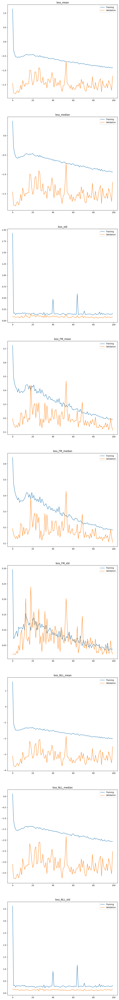

In [ ]:
visualize_training_results(r, loglog = False)

In [27]:
trainer.load_best_model()

In [28]:
model = trainer.model

In [29]:
model.eval()

TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution(
  (encoder): TransformerReturnRepresentations(
    (mlp1): PositionwiseFeedForward(
      (w_1): Linear(in_features=11, out_features=261, bias=True)
      (w_2): Linear(in_features=261, out_features=512, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (act1): LeakyReLU(negative_slope=0.01)
    (encoder_layer): TransformerEncoderLayer(
      (self_attn): MultiheadAttention(
        (out_proj): NonDynamicallyQuantizableLinear(in_features=512, out_features=512, bias=True)
      )
      (linear1): Linear(in_features=512, out_features=1024, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
      (linear2): Linear(in_features=1024, out_features=512, bias=True)
      (norm1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
      (norm2): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
      (dropout1): Dropout(p=0.1, inplace=False)
      (dropout2): Dropout(p=0.1, inplace=False)
  

In [30]:
trainer.load_best_model()

In [31]:
trainer.model.cuda()

TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution(
  (encoder): TransformerReturnRepresentations(
    (mlp1): PositionwiseFeedForward(
      (w_1): Linear(in_features=11, out_features=261, bias=True)
      (w_2): Linear(in_features=261, out_features=512, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (act1): LeakyReLU(negative_slope=0.01)
    (encoder_layer): TransformerEncoderLayer(
      (self_attn): MultiheadAttention(
        (out_proj): NonDynamicallyQuantizableLinear(in_features=512, out_features=512, bias=True)
      )
      (linear1): Linear(in_features=512, out_features=1024, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
      (linear2): Linear(in_features=1024, out_features=512, bias=True)
      (norm1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
      (norm2): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
      (dropout1): Dropout(p=0.1, inplace=False)
      (dropout2): Dropout(p=0.1, inplace=False)
  

In [32]:
trainer.test()

100%|██████████| 196/196 [02:20<00:00,  1.40it/s]


{'loss_mean': -1.8133535385131836,
 'loss_median': -1.8147504329681396,
 'loss_std': 0.08113419264554977,
 'loss_FM_mean': 0.13547222316265106,
 'loss_FM_median': 0.13401000201702118,
 'loss_FM_std': 0.019894501194357872,
 'loss_NLL_mean': -3.762178659439087,
 'loss_NLL_median': -3.761310577392578,
 'loss_NLL_std': 0.15370553731918335}

In [33]:
#?ModelToPosteriorCNF

In [34]:
full_model = ModelToPosteriorCNF_LearnedBaseDist(
    model = model.eval(),
    sample_name = "beta",
    sample_shape = (P,),
    n_samples=1000,
    batch_size = BATCH_SIZE//4,
    solve_adjoint = True,
    atol = 1e-8,
    rtol = 1e-8,
    #device = torch.device("cpu")
    name = "full_model",
    target_device = torch.device("cpu")
)

full_model_no_FM = ModelToPosteriorCNF_LearnedBaseDist(
    model = model.eval(),
    sample_name = "beta",
    sample_shape = (P,),
    n_samples=1000,
    batch_size = BATCH_SIZE//4,
    solve_adjoint = True,
    atol = 1e-8,
    rtol = 1e-8,
    sample_only_base_dist = True,
    name = "full_model_no_FM",
    target_device = torch.device("cpu")
)

benchmark_params_ppgrogram = data_generator.curriculum.get_params(-1)
print(f"params for pprogram: {benchmark_params_ppgrogram}")

pprogram1 = make_lm_program_Laplace_ig(**benchmark_params_ppgrogram)

pprogram1_y = return_only_y(pprogram1)
print_code(pprogram1)






params for pprogram: {'tau': 1.0, 'a': 5.0, 'b': 2.0}
        def multivariate_lm_return_dict(x: torch.Tensor, y: torch.Tensor = None) -> dict:
                # Define distributions for the global parameters
                sigma_squared_dist = dist.InverseGamma(a, b)

                sigma_squared = pyro.sample("sigma_squared", sigma_squared_dist).squeeze()

                beta_dist = dist.Laplace(torch.zeros(x.shape[1]), torch.ones(x.shape[1]) * tau).to_event(1)
                beta = pyro.sample("beta", beta_dist)

                # Compute mean using matrix multiplication
                mean = torch.matmul(x, beta)

                with pyro.plate("data", len(x)):
                        y = pyro.sample("obs", pyro.distributions.Normal(mean, sigma_squared), obs=y)


                return {
                        "x": x,
                        "y": y,
                        "sigma_squared": sigma_squared,
                        "beta": beta
                }



In [35]:
hmc_sampler = Hamiltionian_MC(pprogram = pprogram1_y, n_warmup=500, n_samples=1_000)

vi = Variational_Inference(
    pprogram=pprogram1,
    guide = None,
    n_steps = 2000,
    n_samples=1_000,
    lr = 1e-2
)


In [36]:
evaluation = Evaluate(
    posterior_model = full_model,
    evaluation_loader = trainer.testset,
    comparison_models= [full_model_no_FM, hmc_sampler, vi],
    n_evaluation_cases=100,
    save_path= SAVE_PATH_EVALUATION,
    overwrite_results = True
)

The save path is not empty and the overwrite flag is set, the results will be overwritten


In [37]:
evaluation.run_evaluation()

Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:09<15:38,  9.48s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:19<15:32,  9.52s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:28<15:34,  9.63s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [00:38<15:16,  9.55s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [00:47<15:03,  9.51s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [00:57<14:53,  9.50s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:06<14:50,  9.58s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [01:16<14:38,  9.55s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [01:25<14:25,  9.52s/it]

....................


Sampling posterior:  10%|█         | 10/100 [01:35<14:15,  9.51s/it]

....................


Sampling posterior:  11%|█         | 11/100 [01:45<14:12,  9.58s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [01:54<13:59,  9.55s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [02:04<13:50,  9.55s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [02:13<13:41,  9.55s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [02:23<13:38,  9.63s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [02:32<13:24,  9.58s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [02:42<13:14,  9.58s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [02:52<13:12,  9.66s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [03:01<13:00,  9.63s/it]

....................


Sampling posterior:  20%|██        | 20/100 [03:11<12:48,  9.61s/it]

....................


Sampling posterior:  21%|██        | 21/100 [03:20<12:35,  9.57s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [03:30<12:28,  9.59s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [03:39<12:15,  9.55s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [03:49<12:02,  9.50s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [03:58<11:51,  9.48s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [04:08<11:49,  9.58s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [04:18<11:38,  9.57s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [04:27<11:26,  9.53s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [04:37<11:15,  9.51s/it]

....................


Sampling posterior:  30%|███       | 30/100 [04:46<11:09,  9.56s/it]

....................


Sampling posterior:  31%|███       | 31/100 [04:56<10:56,  9.51s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [05:05<10:47,  9.53s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [05:15<10:42,  9.59s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [05:24<10:28,  9.53s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [05:34<10:18,  9.51s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [05:43<10:08,  9.51s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [05:53<10:02,  9.57s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [06:03<09:51,  9.54s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [06:12<09:40,  9.51s/it]

....................


Sampling posterior:  40%|████      | 40/100 [06:21<09:29,  9.49s/it]

....................


Sampling posterior:  41%|████      | 41/100 [06:31<09:24,  9.56s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [06:41<09:12,  9.53s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [06:50<09:01,  9.50s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [07:00<08:56,  9.58s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [07:09<08:46,  9.57s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [07:19<08:35,  9.54s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [07:28<08:24,  9.53s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [07:38<08:18,  9.58s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [07:47<08:06,  9.55s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [07:57<07:56,  9.52s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [08:06<07:46,  9.52s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [08:16<07:39,  9.57s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [08:26<07:27,  9.51s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [08:35<07:16,  9.49s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [08:44<07:07,  9.49s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [08:54<07:02,  9.59s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [09:04<06:50,  9.54s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [09:13<06:40,  9.54s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [09:23<06:33,  9.59s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [09:32<06:22,  9.56s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [09:42<06:11,  9.53s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [09:51<06:01,  9.52s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [10:01<05:55,  9.62s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [10:11<05:44,  9.58s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [10:20<05:34,  9.55s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [10:30<05:24,  9.53s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [10:39<05:17,  9.61s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [10:49<05:06,  9.58s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [10:59<04:56,  9.56s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [11:08<04:48,  9.63s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [11:18<04:38,  9.59s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [11:27<04:27,  9.55s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [11:37<04:16,  9.50s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [11:46<04:09,  9.59s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [11:56<03:59,  9.57s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [12:05<03:48,  9.54s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [12:15<03:39,  9.52s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [12:25<03:31,  9.60s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [12:34<03:20,  9.55s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [12:44<03:10,  9.53s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [12:53<03:00,  9.52s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [13:03<02:52,  9.57s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [13:12<02:42,  9.53s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [13:22<02:32,  9.55s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [13:32<02:24,  9.63s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [13:41<02:14,  9.60s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [13:51<02:04,  9.57s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [14:00<01:54,  9.54s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [14:10<01:45,  9.60s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [14:19<01:35,  9.57s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [14:29<01:26,  9.57s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [14:39<01:16,  9.56s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [14:48<01:07,  9.64s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [14:58<00:57,  9.57s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [15:07<00:47,  9.52s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [15:17<00:38,  9.60s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [15:26<00:28,  9.56s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [15:36<00:19,  9.59s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [15:46<00:09,  9.57s/it]

....................


100%|██████████| 100/100 [05:29<00:00,  3.29s/it]


Comparison to ground truth:

Summarized results:


,Model,GT,Mean_joint_Wasserstein_distance with metric euclidean,Mean_joint_MMD,Mean_joint_CST_accuracy,Mean_joint_CST_roc_auc_score,Mean_gt_parameter_Perplextiy,Mean_gt_parameter_MAP diff,Mean_gt_parameter_Mean diff,Std_joint_Wasserstein_distance with metric euclidean,Std_joint_MMD,Std_joint_CST_accuracy,Std_joint_CST_roc_auc_score,Std_gt_parameter_Perplextiy,Std_gt_parameter_MAP diff,Std_gt_parameter_Mean diff
0,full_model,gt,23.213644,0.058214,0.48680,0.48680,2.394082,0.163276,0.155106,0.005105,0.000067,0.031314,0.031314,3.713046,0.072865,0.069104
1,full_model_no_FM,gt,23.210312,0.058284,0.49160,0.49160,3.231728,0.148915,0.140907,0.004900,0.000074,0.036968,0.036968,3.842789,0.070951,0.070751
2,Hamiltonian Monte Carlo,gt,23.209880,0.058226,0.49340,0.49340,5.463454,0.139417,0.130753,0.004321,0.000051,0.029915,0.029915,5.028195,0.071655,0.068277
3,Variational Inference with guide: AutoDiagonal...,gt,23.189333,0.058418,0.48605,0.48605,-28.117978,0.201450,0.197705,0.002221,0.000036,0.032046,0.032046,79.600105,0.220942,0.216860


P-values:


,Model 1,Model 2,joint_Wasserstein_distance with metric euclidean_p-value,joint_MMD_p-value,joint_CST_accuracy_p-value,joint_CST_roc_auc_score_p-value,gt_parameter_Perplextiy_p-value,gt_parameter_MAP diff_p-value,gt_parameter_Mean diff_p-value
0,full_model,full_model_no_FM,8.021441e-05,3.008447e-09,0.404931,0.394365,7.789676e-09,1.010992e-05,1.262627e-09
1,full_model,Hamiltonian Monte Carlo,3.540018e-07,1.798368e-01,0.224462,0.261239,2.292085e-14,1.580332e-08,6.957423e-14
2,full_model,Variational Inference with guide: AutoDiagonal...,3.896560e-18,4.015477e-18,0.716111,0.702858,6.024354e-11,2.212564e-03,3.212424e-03
3,full_model_no_FM,Hamiltonian Monte Carlo,7.180812e-01,2.412820e-09,0.827640,0.845454,1.318227e-11,9.433384e-03,2.348957e-06
4,full_model_no_FM,Variational Inference with guide: AutoDiagonal...,3.896560e-18,6.727843e-17,0.236378,0.224303,2.956018e-12,2.382607e-01,4.391537e-01
5,Hamiltonian Monte Carlo,Variational Inference with guide: AutoDiagonal...,3.896560e-18,3.894582e-18,0.025212,0.027748,8.012097e-17,7.727197e-01,5.928020e-04



Comparison among models:

Summarized results:


,Model 1,Model 2,Mean_Wasserstein_distance with metric euclidean,Mean_MMD,Mean_CST_accuracy,Mean_CST_roc_auc_score,Std_Wasserstein_distance with metric euclidean,Std_MMD,Std_CST_accuracy,Std_CST_roc_auc_score
0,full_model,full_model_no_FM,0.450473,0.156779,0.692445,0.692445,0.124909,0.101688,0.066938,0.066938
1,full_model,Hamiltonian Monte Carlo,0.479294,0.464948,0.822800,0.822800,0.141300,0.384594,0.087112,0.087112
2,full_model,Variational Inference with guide: AutoDiagonal...,0.775138,1.613179,0.963755,0.963755,0.807987,1.255315,0.026500,0.026500
3,full_model_no_FM,Hamiltonian Monte Carlo,0.426240,0.278765,0.758725,0.758725,0.131765,0.306664,0.096595,0.096595
4,full_model_no_FM,Variational Inference with guide: AutoDiagonal...,0.735648,1.428373,0.953925,0.953925,0.818094,1.291004,0.029601,0.029601
5,Hamiltonian Monte Carlo,Variational Inference with guide: AutoDiagonal...,0.612665,1.043725,0.903955,0.903955,0.850976,1.504821,0.041576,0.041576


P-values:


,Pair 1: Model A,Pair 1: Model B,Pair 2: Model A,Pair 2: Model B,Wasserstein_distance with metric euclidean_p-value,MMD_p-value,CST_accuracy_p-value,CST_roc_auc_score_p-value
0,full_model,full_model_no_FM,full_model,Hamiltonian Monte Carlo,1.164436e-01,9.166915e-16,2.499320e-20,2.586634e-20
1,full_model,full_model_no_FM,full_model,Variational Inference with guide: AutoDiagonal...,5.168696e-07,2.562144e-34,2.535007e-34,2.536007e-34
2,full_model,full_model_no_FM,full_model_no_FM,Hamiltonian Monte Carlo,9.587894e-02,3.242053e-02,2.556786e-06,2.572159e-06
3,full_model,full_model_no_FM,full_model_no_FM,Variational Inference with guide: AutoDiagonal...,3.074737e-03,2.720791e-34,2.534435e-34,2.535292e-34
4,full_model,Hamiltonian Monte Carlo,full_model,Variational Inference with guide: AutoDiagonal...,1.561091e-04,7.219425e-25,3.387873e-26,3.478038e-26
5,full_model,Hamiltonian Monte Carlo,full_model_no_FM,Hamiltonian Monte Carlo,2.139741e-03,4.550029e-07,1.097073e-06,1.103922e-06
6,full_model,Hamiltonian Monte Carlo,Hamiltonian Monte Carlo,Variational Inference with guide: AutoDiagonal...,3.696696e-05,7.384143e-08,1.930996e-11,1.867138e-11
7,full_model,Variational Inference with guide: AutoDiagonal...,full_model_no_FM,Variational Inference with guide: AutoDiagonal...,6.314101e-02,3.891024e-03,1.994812e-02,2.047423e-02
8,full_model,Variational Inference with guide: AutoDiagonal...,Hamiltonian Monte Carlo,Variational Inference with guide: AutoDiagonal...,2.402127e-09,2.967459e-20,7.891528e-21,7.892315e-21
9,full_model_no_FM,Hamiltonian Monte Carlo,full_model_no_FM,Variational Inference with guide: AutoDiagonal...,1.640564e-05,3.377332e-28,3.176031e-29,3.265485e-29


{'summarized_results': {'comparison_to_gt':                                                Model  GT  \
  0                                         full_model  gt   
  1                                   full_model_no_FM  gt   
  2                            Hamiltonian Monte Carlo  gt   
  3  Variational Inference with guide: AutoDiagonal...  gt   
  
     Mean_joint_Wasserstein_distance with metric euclidean  Mean_joint_MMD  \
  0                                          23.213644            0.058214   
  1                                          23.210312            0.058284   
  2                                          23.209880            0.058226   
  3                                          23.189333            0.058418   
  
     Mean_joint_CST_accuracy  Mean_joint_CST_roc_auc_score  \
  0                  0.48680                       0.48680   
  1                  0.49160                       0.49160   
  2                  0.49340                       0.49340   
  3 

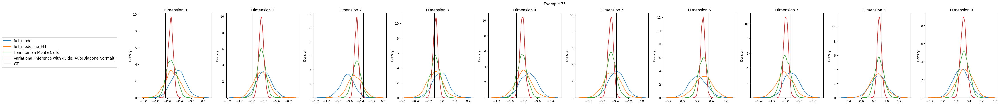

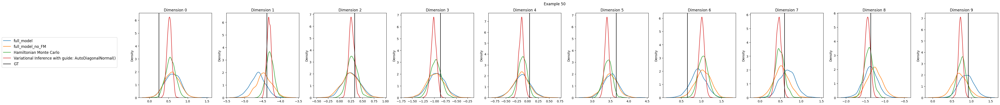

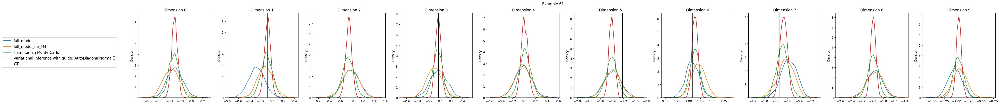

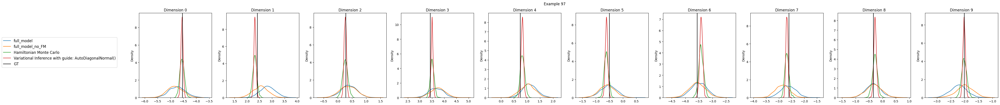

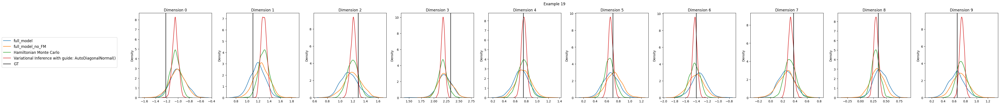

In [38]:
evaluation.plot_results()